## Imports

In [1]:
import pandas as pd
from pandas.api.types import CategoricalDtype
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
import datetime
warnings.filterwarnings('ignore')
#print(sns.__version__)

## Load Data

Note: Data obtained from various sources (via scraping with Beautiful Soup, manual entry) and compiled into .xlsx format prior to this workstream

In [2]:
#Read file into a DataFrame and print head.
xword_data = pd.ExcelFile('../../NYT_XWord_data_master.xlsx', engine='openpyxl')
print(xword_data.sheet_names)

['Sheet1']


In [3]:
df1 = xword_data.parse('Sheet1')

In [4]:
df1.head(35)

,Puzzle_Date,GMS_Completed,IS1_Completed,IS2_Completed,Completed_Date (IS1),Completed_Date (IS2),Day_of_Week,Time (s) (IS1),Time (s) (IS2),Global_Median_Solver_Time(s),...,90_180_Rot_Sym,LR_UD_Sym,Diag_Sym,Black_Square_Fill,Outside_Grid,Unchecked_Sq,Uniclue,Duplicate_Answers,Quantum,Wordplay
0,2024-02-24,1,1.0,1.0,2024-02-24 07:23:10,2024-02-24 14:54:10,Saturday,604.0,871.0,1044,...,0,0,0,0,0,0,0,0,0,6.0
1,2024-02-23,1,1.0,1.0,2024-02-23 06:49:34,2024-02-24 09:51:55,Friday,518.0,1255.0,1022,...,1,0,0,0,0,0,0,0,0,3.0
2,2024-02-22,1,1.0,1.0,2024-02-22 08:13:32,2024-02-22 18:05:02,Thursday,531.0,920.0,1137,...,0,0,0,0,0,0,0,0,0,3.0
3,2024-02-21,1,1.0,1.0,2024-02-21 06:49:48,2024-02-21 10:33:24,Wednesday,317.0,453.0,549,...,0,0,0,0,0,0,0,0,0,2.0
4,2024-02-20,1,1.0,1.0,2024-02-20 07:26:53,2024-02-20 17:41:05,Tuesday,347.0,587.0,562,...,0,0,0,0,0,0,0,0,0,1.0
5,2024-02-19,1,1.0,1.0,2024-02-19 07:27:02,2024-02-19 13:51:53,Monday,332.0,421.0,371,...,0,0,0,0,0,0,0,0,0,2.0
6,2024-02-18,1,1.0,1.0,2024-02-17 18:29:19,2024-02-17 21:51:25,Sunday,1019.0,1238.0,1541,...,0,0,0,0,0,0,0,0,0,6.0
7,2024-02-17,1,1.0,1.0,2024-02-17 07:49:40,2024-02-17 12:27:42,Saturday,635.0,1443.0,1143,...,0,0,0,0,0,0,0,0,0,4.0
8,2024-02-16,1,1.0,1.0,2024-02-16 07:09:58,2024-02-16 13:28:37,Friday,509.0,700.0,822,...,0,0,0,0,0,0,0,0,0,8.0
9,2024-02-15,1,1.0,1.0,2024-02-15 06:54:05,2024-02-15 18:28:45,Thursday,853.0,1840.0,1527,...,0,0,0,0,0,0,0,0,0,4.0


In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2246 entries, 0 to 2245
Data columns (total 72 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Puzzle_Date                   2246 non-null   datetime64[ns]
 1   GMS_Completed                 2246 non-null   int64         
 2   IS1_Completed                 1202 non-null   float64       
 3   IS2_Completed                 1191 non-null   float64       
 4   Completed_Date (IS1)          1202 non-null   datetime64[ns]
 5   Completed_Date (IS2)          1191 non-null   datetime64[ns]
 6   Day_of_Week                   2246 non-null   object        
 7   Time (s) (IS1)                1202 non-null   float64       
 8   Time (s) (IS2)                1191 non-null   float64       
 9   Global_Median_Solver_Time(s)  2246 non-null   int64         
 10  Difficulty                    2246 non-null   object        
 11  Median_Solver%_AVG_PM         

## Data Cleaning and Global Median Solver Feature Creation
A few generally useful operations for the exploratory analysis of Individual Solver 1 (IS1)

In [6]:
# Delete weird columns at the back end of the imported data
#df2 = df1.drop(columns=df1.columns[-6:], axis=1)

In [7]:
# Drop Some columns that, while potentially useful for predictive modeling, aren't necessary for the EDA.
df2 = df1.drop(['Completed_Date (IS1)', 'Completed_Date (IS2)', 'Time (s) (IS1)', 'Time (s) (IS2)', 'Difficulty', '1st_Constructor', '1st_Constuctor_Gender', '1st_Constructor_Puzzle_N', '1st_Constructor_Debut', '1st_Constructor_Scrabble_Avg', '1st_Constructor_Fresh%_Avg', '2nd_Constructor', '2nd_Constuctor_Gender', '2nd_Constructor_Puzzle_N', '2nd_Constructor_Debut', '2nd_Constructor_Scrabble_Avg', '2nd_Constructor_Fresh%_Avg', '3rd_Constructor', '3rd_Constuctor_Gender', '3rd_Constructor_Puzzle_N', '3rd_Constructor_Debut', '3rd_Constructor_Scrabble_Avg', '3rd_Constructor_Fresh%_Avg', 'Spans', '2_Stacks', '3_4_Stacks', 'Mirror_Sym', 'UD_Sym', 'Asym', 'Supersym', '90_180_Rot_Sym', 'LR_UD_Sym', 'Diag_Sym', 'Black_Square_Fill','Outside_Grid', 'Unchecked_Sq','Uniclue','Duplicate_Answers','Quantum'], axis=1)

In [8]:
# Rename some columns for brevity and clarity
df2.rename(columns={'Constructors(by seniority)': 'Constructors', 'Median_Solver%_AVG_PM':'Diff%_from_10pMA(GMS)', 'Day_of_Week': 'DOW', 'Puzzle_Date': 'P_Date', 'Median_Solver%_AVG_PM': 'GMST_Diff%_from_GMS_10p_MA'}, inplace=True)

In [9]:
# It will be useful generally to have puzzle dates as strings in other columns along with the datetimes 
df2['P_Date_str'] = df2['P_Date'].dt.strftime('%Y-%m-%d') #we want datetime as a string to index into here

In [10]:
# Convert global median solve times (GMTs) per puzzle to minutes and drop times in seconds
df2["GMST(m)"] = df2["Global_Median_Solver_Time(s)"]/60  #GMST = Global Median solve times
df2.drop(['Global_Median_Solver_Time(s)'], axis=1, inplace=True)

In [11]:
#GMS_pds_l40_dw
#Provides decay-weighted(dw), puzzle day-specific (pds) mean solve time performance for GMS over the previous 40 puzzles relative to a given puzzle
# Note also that, unlike the 10-puzzle moving average, this weighted average does NOT include the "puzzle at hand" itself

df2 = df2.sort_values(by=['DOW', 'P_Date'], ascending = False)

# Gradual decay
w = np.arange(1,41)
w = list(w)

# No decay
# w = np.ones(40)
# w = list(w)

df2["GMS_pds_l40_dw_1"] = df2.groupby(['DOW'])['GMST(m)'].shift(-1)*w[0]
df2["GMS_pds_l40_dw_2"] = df2.groupby(['DOW'])['GMST(m)'].shift(-2)*w[1]
df2["GMS_pds_l40_dw_3"] = df2.groupby(['DOW'])['GMST(m)'].shift(-3)*w[2]
df2["GMS_pds_l40_dw_4"] = df2.groupby(['DOW'])['GMST(m)'].shift(-4)*w[3]
df2["GMS_pds_l40_dw_5"] = df2.groupby(['DOW'])['GMST(m)'].shift(-5)*w[4]
df2["GMS_pds_l40_dw_6"] = df2.groupby(['DOW'])['GMST(m)'].shift(-6)*w[5]
df2["GMS_pds_l40_dw_7"] = df2.groupby(['DOW'])['GMST(m)'].shift(-7)*w[6]
df2["GMS_pds_l40_dw_8"] = df2.groupby(['DOW'])['GMST(m)'].shift(-8)*w[7]
df2["GMS_pds_l40_dw_9"] = df2.groupby(['DOW'])['GMST(m)'].shift(-9)*w[8]
df2["GMS_pds_l40_dw_10"] = df2.groupby(['DOW'])['GMST(m)'].shift(-10)*w[9]
df2["GMS_pds_l40_dw_11"] = df2.groupby(['DOW'])['GMST(m)'].shift(-11)*w[10]
df2["GMS_pds_l40_dw_12"] = df2.groupby(['DOW'])['GMST(m)'].shift(-12)*w[11]
df2["GMS_pds_l40_dw_13"] = df2.groupby(['DOW'])['GMST(m)'].shift(-13)*w[12]
df2["GMS_pds_l40_dw_14"] = df2.groupby(['DOW'])['GMST(m)'].shift(-14)*w[13]
df2["GMS_pds_l40_dw_15"] = df2.groupby(['DOW'])['GMST(m)'].shift(-15)*w[14]
df2["GMS_pds_l40_dw_16"] = df2.groupby(['DOW'])['GMST(m)'].shift(-16)*w[15]
df2["GMS_pds_l40_dw_17"] = df2.groupby(['DOW'])['GMST(m)'].shift(-17)*w[16]
df2["GMS_pds_l40_dw_18"] = df2.groupby(['DOW'])['GMST(m)'].shift(-18)*w[17]
df2["GMS_pds_l40_dw_19"] = df2.groupby(['DOW'])['GMST(m)'].shift(-19)*w[18]
df2["GMS_pds_l40_dw_20"] = df2.groupby(['DOW'])['GMST(m)'].shift(-20)*w[19]
df2["GMS_pds_l40_dw_21"] = df2.groupby(['DOW'])['GMST(m)'].shift(-21)*w[20]
df2["GMS_pds_l40_dw_22"] = df2.groupby(['DOW'])['GMST(m)'].shift(-22)*w[21]
df2["GMS_pds_l40_dw_23"] = df2.groupby(['DOW'])['GMST(m)'].shift(-23)*w[22]
df2["GMS_pds_l40_dw_24"] = df2.groupby(['DOW'])['GMST(m)'].shift(-24)*w[23]
df2["GMS_pds_l40_dw_25"] = df2.groupby(['DOW'])['GMST(m)'].shift(-25)*w[24]
df2["GMS_pds_l40_dw_26"] = df2.groupby(['DOW'])['GMST(m)'].shift(-26)*w[25]
df2["GMS_pds_l40_dw_27"] = df2.groupby(['DOW'])['GMST(m)'].shift(-27)*w[26]
df2["GMS_pds_l40_dw_28"] = df2.groupby(['DOW'])['GMST(m)'].shift(-28)*w[27]
df2["GMS_pds_l40_dw_29"] = df2.groupby(['DOW'])['GMST(m)'].shift(-29)*w[28]
df2["GMS_pds_l40_dw_30"] = df2.groupby(['DOW'])['GMST(m)'].shift(-30)*w[29]
df2["GMS_pds_l40_dw_31"] = df2.groupby(['DOW'])['GMST(m)'].shift(-31)*w[30]
df2["GMS_pds_l40_dw_32"] = df2.groupby(['DOW'])['GMST(m)'].shift(-32)*w[31]
df2["GMS_pds_l40_dw_33"] = df2.groupby(['DOW'])['GMST(m)'].shift(-33)*w[32]
df2["GMS_pds_l40_dw_34"] = df2.groupby(['DOW'])['GMST(m)'].shift(-34)*w[33]
df2["GMS_pds_l40_dw_35"] = df2.groupby(['DOW'])['GMST(m)'].shift(-35)*w[34]
df2["GMS_pds_l40_dw_36"] = df2.groupby(['DOW'])['GMST(m)'].shift(-36)*w[35]
df2["GMS_pds_l40_dw_37"] = df2.groupby(['DOW'])['GMST(m)'].shift(-37)*w[36]
df2["GMS_pds_l40_dw_38"] = df2.groupby(['DOW'])['GMST(m)'].shift(-38)*w[37]
df2["GMS_pds_l40_dw_39"] = df2.groupby(['DOW'])['GMST(m)'].shift(-39)*w[38]
df2["GMS_pds_l40_dw_40"] = df2.groupby(['DOW'])['GMST(m)'].shift(-40)*w[39]


df2["GMS_pds_l40_dw_1_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-1)/df2.groupby(['DOW'])['GMST(m)'].shift(-1))*w[0]
df2["GMS_pds_l40_dw_2_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-2)/df2.groupby(['DOW'])['GMST(m)'].shift(-2))*w[1]
df2["GMS_pds_l40_dw_3_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-3)/df2.groupby(['DOW'])['GMST(m)'].shift(-3))*w[2]
df2["GMS_pds_l40_dw_4_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-4)/df2.groupby(['DOW'])['GMST(m)'].shift(-4))*w[3]
df2["GMS_pds_l40_dw_5_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-5)/df2.groupby(['DOW'])['GMST(m)'].shift(-5))*w[4]
df2["GMS_pds_l40_dw_6_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-6)/df2.groupby(['DOW'])['GMST(m)'].shift(-6))*w[5]
df2["GMS_pds_l40_dw_7_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-7)/df2.groupby(['DOW'])['GMST(m)'].shift(-7))*w[6]
df2["GMS_pds_l40_dw_8_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-8)/df2.groupby(['DOW'])['GMST(m)'].shift(-8))*w[7]
df2["GMS_pds_l40_dw_9_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-9)/df2.groupby(['DOW'])['GMST(m)'].shift(-9))*w[8]
df2["GMS_pds_l40_dw_10_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-10)/df2.groupby(['DOW'])['GMST(m)'].shift(-10))*w[9]
df2["GMS_pds_l40_dw_11_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-11)/df2.groupby(['DOW'])['GMST(m)'].shift(-11))*w[10]
df2["GMS_pds_l40_dw_12_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-12)/df2.groupby(['DOW'])['GMST(m)'].shift(-12))*w[11]
df2["GMS_pds_l40_dw_13_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-13)/df2.groupby(['DOW'])['GMST(m)'].shift(-13))*w[12]
df2["GMS_pds_l40_dw_14_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-14)/df2.groupby(['DOW'])['GMST(m)'].shift(-14))*w[13]
df2["GMS_pds_l40_dw_15_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-15)/df2.groupby(['DOW'])['GMST(m)'].shift(-15))*w[14]
df2["GMS_pds_l40_dw_16_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-16)/df2.groupby(['DOW'])['GMST(m)'].shift(-16))*w[15]
df2["GMS_pds_l40_dw_17_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-17)/df2.groupby(['DOW'])['GMST(m)'].shift(-17))*w[16]
df2["GMS_pds_l40_dw_18_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-18)/df2.groupby(['DOW'])['GMST(m)'].shift(-18))*w[17]
df2["GMS_pds_l40_dw_19_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-19)/df2.groupby(['DOW'])['GMST(m)'].shift(-19))*w[18]
df2["GMS_pds_l40_dw_20_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-20)/df2.groupby(['DOW'])['GMST(m)'].shift(-20))*w[19]
df2["GMS_pds_l40_dw_21_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-21)/df2.groupby(['DOW'])['GMST(m)'].shift(-21))*w[20]
df2["GMS_pds_l40_dw_22_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-22)/df2.groupby(['DOW'])['GMST(m)'].shift(-22))*w[21]
df2["GMS_pds_l40_dw_23_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-23)/df2.groupby(['DOW'])['GMST(m)'].shift(-23))*w[22]
df2["GMS_pds_l40_dw_24_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-24)/df2.groupby(['DOW'])['GMST(m)'].shift(-24))*w[23]
df2["GMS_pds_l40_dw_25_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-25)/df2.groupby(['DOW'])['GMST(m)'].shift(-25))*w[24]
df2["GMS_pds_l40_dw_26_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-26)/df2.groupby(['DOW'])['GMST(m)'].shift(-26))*w[25]
df2["GMS_pds_l40_dw_27_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-27)/df2.groupby(['DOW'])['GMST(m)'].shift(-27))*w[26]
df2["GMS_pds_l40_dw_28_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-28)/df2.groupby(['DOW'])['GMST(m)'].shift(-28))*w[27]
df2["GMS_pds_l40_dw_29_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-29)/df2.groupby(['DOW'])['GMST(m)'].shift(-29))*w[28]
df2["GMS_pds_l40_dw_30_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-30)/df2.groupby(['DOW'])['GMST(m)'].shift(-30))*w[29]
df2["GMS_pds_l40_dw_31_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-31)/df2.groupby(['DOW'])['GMST(m)'].shift(-31))*w[30]
df2["GMS_pds_l40_dw_32_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-32)/df2.groupby(['DOW'])['GMST(m)'].shift(-32))*w[31]
df2["GMS_pds_l40_dw_33_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-33)/df2.groupby(['DOW'])['GMST(m)'].shift(-33))*w[32]
df2["GMS_pds_l40_dw_34_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-34)/df2.groupby(['DOW'])['GMST(m)'].shift(-34))*w[33]
df2["GMS_pds_l40_dw_35_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-35)/df2.groupby(['DOW'])['GMST(m)'].shift(-35))*w[34]
df2["GMS_pds_l40_dw_36_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-36)/df2.groupby(['DOW'])['GMST(m)'].shift(-36))*w[35]
df2["GMS_pds_l40_dw_37_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-37)/df2.groupby(['DOW'])['GMST(m)'].shift(-37))*w[36]
df2["GMS_pds_l40_dw_38_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-38)/df2.groupby(['DOW'])['GMST(m)'].shift(-38))*w[37]
df2["GMS_pds_l40_dw_39_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-39)/df2.groupby(['DOW'])['GMST(m)'].shift(-39))*w[38]
df2["GMS_pds_l40_dw_40_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-40)/df2.groupby(['DOW'])['GMST(m)'].shift(-40))*w[39]


df2["GMS_pds_l40_ws"] = df2[["GMS_pds_l40_dw_1", "GMS_pds_l40_dw_2", "GMS_pds_l40_dw_3", "GMS_pds_l40_dw_4", "GMS_pds_l40_dw_5", "GMS_pds_l40_dw_6", "GMS_pds_l40_dw_7", "GMS_pds_l40_dw_8", "GMS_pds_l40_dw_9", "GMS_pds_l40_dw_10", "GMS_pds_l40_dw_11", "GMS_pds_l40_dw_12", "GMS_pds_l40_dw_13", "GMS_pds_l40_dw_14", "GMS_pds_l40_dw_15", "GMS_pds_l40_dw_16", "GMS_pds_l40_dw_17", "GMS_pds_l40_dw_18", "GMS_pds_l40_dw_19", "GMS_pds_l40_dw_20", "GMS_pds_l40_dw_21", "GMS_pds_l40_dw_22", "GMS_pds_l40_dw_23", "GMS_pds_l40_dw_24", "GMS_pds_l40_dw_25",
                            "GMS_pds_l40_dw_26", "GMS_pds_l40_dw_27", "GMS_pds_l40_dw_28", "GMS_pds_l40_dw_29", "GMS_pds_l40_dw_30", "GMS_pds_l40_dw_31", "GMS_pds_l40_dw_32", "GMS_pds_l40_dw_33", "GMS_pds_l40_dw_34", "GMS_pds_l40_dw_35", "GMS_pds_l40_dw_36", "GMS_pds_l40_dw_37", "GMS_pds_l40_dw_38", "GMS_pds_l40_dw_39", "GMS_pds_l40_dw_40"]].sum(axis=1)
df2["GMS_pds_l40_ws_ct"] = df2[["GMS_pds_l40_dw_1_ct", "GMS_pds_l40_dw_2_ct", "GMS_pds_l40_dw_3_ct", "GMS_pds_l40_dw_4_ct", "GMS_pds_l40_dw_5_ct", "GMS_pds_l40_dw_6_ct", "GMS_pds_l40_dw_7_ct", "GMS_pds_l40_dw_8_ct", "GMS_pds_l40_dw_9_ct", "GMS_pds_l40_dw_10_ct", "GMS_pds_l40_dw_11_ct", "GMS_pds_l40_dw_12_ct", "GMS_pds_l40_dw_13_ct", "GMS_pds_l40_dw_14_ct", "GMS_pds_l40_dw_15_ct", "GMS_pds_l40_dw_16_ct", "GMS_pds_l40_dw_17_ct", "GMS_pds_l40_dw_18_ct", "GMS_pds_l40_dw_19_ct", "GMS_pds_l40_dw_20_ct", "GMS_pds_l40_dw_21_ct", "GMS_pds_l40_dw_22_ct", "GMS_pds_l40_dw_23_ct", "GMS_pds_l40_dw_24_ct", "GMS_pds_l40_dw_25_ct",
                               "GMS_pds_l40_dw_26_ct", "GMS_pds_l40_dw_27_ct", "GMS_pds_l40_dw_28_ct", "GMS_pds_l40_dw_29_ct", "GMS_pds_l40_dw_30_ct", "GMS_pds_l40_dw_31_ct", "GMS_pds_l40_dw_32_ct", "GMS_pds_l40_dw_33_ct", "GMS_pds_l40_dw_34_ct", "GMS_pds_l40_dw_35_ct", "GMS_pds_l40_dw_36_ct", "GMS_pds_l40_dw_37_ct", "GMS_pds_l40_dw_38_ct", "GMS_pds_l40_dw_39_ct", "GMS_pds_l40_dw_40_ct"]].sum(axis=1)
df2["GMS_pds_l40_dw"] = df2["GMS_pds_l40_ws"]/df2["GMS_pds_l40_ws_ct"]

# Deleting transient columns
df2 = df2.drop(["GMS_pds_l40_dw_1", "GMS_pds_l40_dw_2", "GMS_pds_l40_dw_3", "GMS_pds_l40_dw_4", "GMS_pds_l40_dw_5", "GMS_pds_l40_dw_6", "GMS_pds_l40_dw_7", "GMS_pds_l40_dw_8", "GMS_pds_l40_dw_9", "GMS_pds_l40_dw_10", "GMS_pds_l40_dw_11", "GMS_pds_l40_dw_12", "GMS_pds_l40_dw_13", "GMS_pds_l40_dw_14", "GMS_pds_l40_dw_15", "GMS_pds_l40_dw_16", "GMS_pds_l40_dw_17", "GMS_pds_l40_dw_18", "GMS_pds_l40_dw_19", "GMS_pds_l40_dw_20", "GMS_pds_l40_dw_21", "GMS_pds_l40_dw_22", "GMS_pds_l40_dw_23", "GMS_pds_l40_dw_24", "GMS_pds_l40_dw_25", "GMS_pds_l40_dw_26", "GMS_pds_l40_dw_27", "GMS_pds_l40_dw_28", "GMS_pds_l40_dw_29", "GMS_pds_l40_dw_30", "GMS_pds_l40_dw_31", "GMS_pds_l40_dw_32", "GMS_pds_l40_dw_33", "GMS_pds_l40_dw_34", "GMS_pds_l40_dw_35", "GMS_pds_l40_dw_36", "GMS_pds_l40_dw_37", "GMS_pds_l40_dw_38", "GMS_pds_l40_dw_39", "GMS_pds_l40_dw_40",  
                "GMS_pds_l40_dw_1_ct", "GMS_pds_l40_dw_2_ct", "GMS_pds_l40_dw_3_ct", "GMS_pds_l40_dw_4_ct", "GMS_pds_l40_dw_5_ct", "GMS_pds_l40_dw_6_ct", "GMS_pds_l40_dw_7_ct", "GMS_pds_l40_dw_8_ct", "GMS_pds_l40_dw_9_ct", "GMS_pds_l40_dw_10_ct", "GMS_pds_l40_dw_11_ct", "GMS_pds_l40_dw_12_ct", "GMS_pds_l40_dw_13_ct", "GMS_pds_l40_dw_14_ct", "GMS_pds_l40_dw_15_ct", "GMS_pds_l40_dw_16_ct", "GMS_pds_l40_dw_17_ct", "GMS_pds_l40_dw_18_ct", "GMS_pds_l40_dw_19_ct", "GMS_pds_l40_dw_20_ct", "GMS_pds_l40_dw_21_ct", "GMS_pds_l40_dw_22_ct", "GMS_pds_l40_dw_23_ct", "GMS_pds_l40_dw_24_ct", "GMS_pds_l40_dw_25_ct", "GMS_pds_l40_dw_26_ct", "GMS_pds_l40_dw_27_ct", "GMS_pds_l40_dw_28_ct", "GMS_pds_l40_dw_29_ct", "GMS_pds_l40_dw_30_ct", "GMS_pds_l40_dw_31_ct", "GMS_pds_l40_dw_32_ct", "GMS_pds_l40_dw_33_ct", "GMS_pds_l40_dw_34_ct", "GMS_pds_l40_dw_35_ct", "GMS_pds_l40_dw_36_ct", "GMS_pds_l40_dw_37_ct", "GMS_pds_l40_dw_38_ct", "GMS_pds_l40_dw_39_ct", "GMS_pds_l40_dw_40_ct",
                "GMS_pds_l40_ws", "GMS_pds_l40_ws_ct"], axis = 1)

In [12]:
# Calculate 10-puzzle moving average for global median solver (GMS) raw solve times, within Day of Week
# Unlike for Individual Solvers (see below), we do NOT have completion dates for median solver per puzzle. It is therefore assumed that completion date tracks with puzzle date (obviously not always going to be true, but approximates true closely enough for our purposes)
df2 = df2.sort_values(by=['DOW','P_Date'], ascending = True)
df2['GMST(m)_10p_MA'] = df2.groupby('DOW')['GMST(m)'].transform(lambda x: x.rolling(10, 3).mean().reset_index(drop=True))
df2 = df2.sort_values(by=['DOW','P_Date'], ascending = False)

In [13]:
# Calculate deviation from GMS_pds_l40_dw for GMS
df2['GMST_Diff%_from_GMS_pds_l40_dw'] = (((df2['GMST(m)'] - df2['GMS_pds_l40_dw']))/((df2['GMST(m)'] + df2['GMS_pds_l40_dw'])/2)*100).round(2)

df2 = df2.sort_values(by=['DOW','P_Date'], ascending = False)

In [14]:
# It will be useful to have year of puzzle issue in a separate column for analysis below
df2['P_Yr'] = df2['P_Date'].dt.to_period('Y')
df2['P_Yr'].value_counts()

2020    366
2023    365
2021    365
2019    365
2022    365
2018    365
2024     55
Freq: A-DEC, Name: P_Yr, dtype: int64

In [15]:
# Also, a column indicating pre-2023 puzzle issue date or 2023-2024 puzzle issue date
df2.loc[(df2["P_Yr"] != "2023") & (df2["P_Yr"] != "2024"), "2023+_puzzle"] = 0 #pre-2023 puzzle issue date
df2.loc[(df2["P_Yr"] == "2023") | (df2["P_Yr"] == "2024"), "2023+_puzzle"] = 1 #2023 or 2024 puzzle issue date
df2['2023+_puzzle'].value_counts()

0.0    1826
1.0     420
Name: 2023+_puzzle, dtype: int64

In [16]:
# A numerical column for puzzle day that starts with Sunday and ends with Saturday
df2.loc[(df2["DOW"] == "Sunday"), "DOW_num"] = 1 
df2.loc[(df2["DOW"] == "Monday"), "DOW_num"] = 2
df2.loc[(df2["DOW"] == "Tuesday"), "DOW_num"] = 3
df2.loc[(df2["DOW"] == "Wednesday"), "DOW_num"] = 4
df2.loc[(df2["DOW"] == "Thursday"), "DOW_num"] = 5
df2.loc[(df2["DOW"] == "Friday"), "DOW_num"] = 6
df2.loc[(df2["DOW"] == "Saturday"), "DOW_num"] = 7

In [17]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2246 entries, 3 to 2241
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          2246 non-null   datetime64[ns]
 1   GMS_Completed                   2246 non-null   int64         
 2   IS1_Completed                   1202 non-null   float64       
 3   IS2_Completed                   1191 non-null   float64       
 4   DOW                             2246 non-null   object        
 5   GMST_Diff%_from_GMS_10p_MA      2246 non-null   int64         
 6   Grid Size                       2246 non-null   int64         
 7   No_Constructors                 2246 non-null   int64         
 8   Constructors                    2246 non-null   object        
 9   Words                           2246 non-null   int64         
 10  Blocks                          2246 non-null   int64         
 11  Unus

In [18]:
# Move new columns to logical places in dataframe
col = df2.pop('P_Date_str')
df2.insert(1, col.name, col)

col = df2.pop('P_Yr')
df2.insert(2, col.name, col)

col = df2.pop('2023+_puzzle')
df2.insert(3, col.name, col)

col = df2.pop('DOW')
df2.insert(4, col.name, col)

col = df2.pop('DOW_num')
df2.insert(5, col.name, col)

col = df2.pop('GMST(m)')
df2.insert(6, col.name, col)

col = df2.pop('GMST(m)_10p_MA')
df2.insert(7, col.name, col)

col = df2.pop('GMST_Diff%_from_GMS_10p_MA')
df2.insert(8, col.name, col)

col = df2.pop('GMS_pds_l40_dw')
df2.insert(9, col.name, col)

col = df2.pop('GMST_Diff%_from_GMS_pds_l40_dw')
df2.insert(10, col.name, col)

In [19]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2246 entries, 3 to 2241
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          2246 non-null   datetime64[ns]
 1   P_Date_str                      2246 non-null   object        
 2   P_Yr                            2246 non-null   period[A-DEC] 
 3   2023+_puzzle                    2246 non-null   float64       
 4   DOW                             2246 non-null   object        
 5   DOW_num                         2246 non-null   float64       
 6   GMST(m)                         2246 non-null   float64       
 7   GMST(m)_10p_MA                  2232 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      2246 non-null   int64         
 9   GMS_pds_l40_dw                  2239 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  2239 non-null   float64       
 11  GMS_

#### Overview Statistics for GMS

In [20]:
# Make deep copy of df2
df_GMS = df2.copy()

In [21]:
# Compute total solve time for GMS, and solve time per solve period
print(df_GMS["GMST(m)"].sum())
print(df_GMS.loc[df_GMS["P_Yr"]==("2018"), "GMST(m)"].sum())
print(df_GMS.loc[df_GMS["P_Yr"]==("2019"), "GMST(m)"].sum())
print(df_GMS.loc[df_GMS["P_Yr"]==("2020"), "GMST(m)"].sum())
print(df_GMS.loc[df_GMS["P_Yr"]==("2021"), "GMST(m)"].sum())
print(df_GMS.loc[df_GMS["P_Yr"]==("2022"), "GMST(m)"].sum())
print(df_GMS.loc[df_GMS["P_Yr"]==("2023"), "GMST(m)"].sum())
print(df_GMS.loc[df_GMS["P_Yr"]==("2024"), "GMST(m)"].sum())

46453.649999999994
9806.733333333334
8391.966666666667
7555.516666666667
6850.883333333333
6758.933333333333
6249.233333333333
840.3833333333333


In [22]:
# Checkpoint
df_GMS.to_csv('../data/df_GMS.csv', index=False)

## GMS Figure Creation

#### GMS Solve Performance Over Time

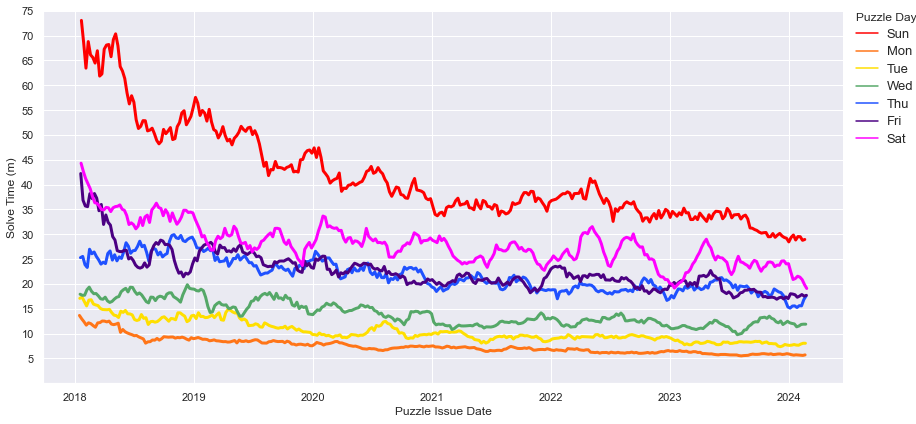

In [23]:
# Plot 10-puzzle moving average of GMS Solve Times by Day of Week
#Fig. 3

sns.set(font_scale=1)

p = sns.relplot(
    data=df_GMS, marker = "", x="P_Date", y="GMST(m)_10p_MA", hue="DOW", hue_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], height=6, aspect=2, palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "indigo", "fuchsia"],
    kind="line", linewidth=3
).set(title="", 
    ylabel="Solve Time (m)",
    xlabel= "Puzzle Issue Date", yticks = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75], ylim=[0,75]
)

# Modify legend
leg = p._legend
leg.set_title("Puzzle Day")
leg.set_bbox_to_anchor([.88, .975])  # coordinates of lower left of bounding box
leg.get_title().set_fontsize(12)
leg._loc = 2  # if required you can set the loc
leg.get_texts()[0].set_fontsize(13)
leg.get_texts()[0].set_text('Sun')
leg.get_texts()[1].set_fontsize(13)
leg.get_texts()[1].set_text('Mon')
leg.get_texts()[2].set_fontsize(13)
leg.get_texts()[2].set_text('Tue')
leg.get_texts()[3].set_fontsize(13)
leg.get_texts()[3].set_text('Wed')
leg.get_texts()[4].set_fontsize(13)
leg.get_texts()[4].set_text('Thu')
leg.get_texts()[5].set_fontsize(13)
leg.get_texts()[5].set_text('Fri')
leg.get_texts()[6].set_fontsize(13)
leg.get_texts()[6].set_text('Sat')
leg._legend_box.align = "left"  # or left, or center

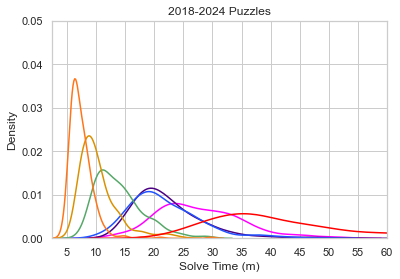

In [24]:
# Density Plot for Entire Sample Time Range (2018-2024)
# Figure 2

df_GMS['plot_seq_map'] = df_GMS['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})

sns.set(style="whitegrid")
ax = sns.kdeplot(data=df_GMS, x = "GMST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 60)
plt.ylim(0, .05)
plt.xticks([5,10,15,20,25,30,35,40,45,50,55,60])
plt.title('2018-2024 Puzzles')
ax.set_xlabel("Solve Time (m)")
plt.show()

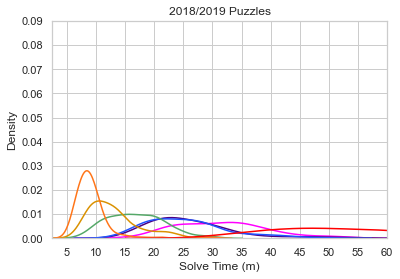

In [25]:
# Density Plot for 2018-2019 Only 
# Figure 3
df1_2018_19 = df_GMS.loc[(df_GMS["P_Yr"] == "2018") | (df_GMS["P_Yr"] == "2019")]

df1_2018_19['plot_seq_map'] = df1_2018_19['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})

sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2018_19, x = "GMST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 60)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40,45,50,55,60])
plt.title('2018/2019 Puzzles')
ax.set_xlabel("Solve Time (m)")
plt.show()

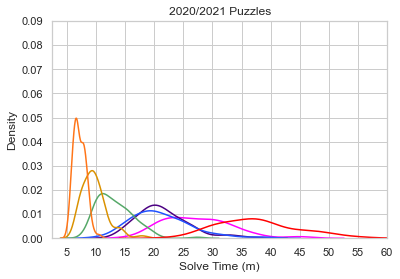

In [26]:
# Density Plot for 2020-2021 Only 
# Figure 3
df1_2020_21 = df_GMS.loc[(df_GMS["P_Yr"] == "2020") | (df_GMS["P_Yr"] == "2021")]

df1_2020_21['plot_seq_map'] = df1_2020_21['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2020_21, x = "GMST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 60)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40,45,50,55,60])
plt.title('2020/2021 Puzzles')
ax.set_xlabel("Solve Time (m)")
plt.show()

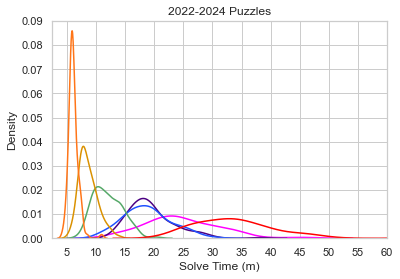

In [27]:
# Density Plot for 2022-2024 Only 
# Figure 3
df1_2022_24 = df_GMS.loc[(df_GMS["P_Yr"] == "2022") | (df_GMS["P_Yr"] == "2023") | (df_GMS["P_Yr"] == "2024")]

df1_2022_24['plot_seq_map'] = df1_2022_24['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2022_24, x = "GMST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40,45,50,55,60])
plt.title('2022-2024 Puzzles')
ax.set_xlabel("Solve Time (m)")
plt.show()

In [28]:
#For obtaining final moving average values per day for Git summary
df2 = df2.sort_values(by=['P_Date'], ascending = False)
df2.head(35)

,P_Date,P_Date_str,P_Yr,2023+_puzzle,DOW,DOW_num,GMST(m),GMST(m)_10p_MA,GMST_Diff%_from_GMS_10p_MA,GMS_pds_l40_dw,...,Scrabble_Illegal,Open_Squares,Freshness_Factor,Overall_Freshness%,Day_Freshness%,Duplicate_Clues,Circle_Count,Shade_Count,Unusual_Sym,Wordplay
0,2024-02-24,2024-02-24,2024,1.0,Saturday,7.0,17.400000,19.081667,-16,23.931382,...,32,85,45.7,79.4,32.0,0,0,0,0,6.0
1,2024-02-23,2024-02-23,2024,1.0,Friday,6.0,17.033333,17.713333,-8,17.733028,...,28,96,51.5,89.5,74.3,0,0,0,1,3.0
2,2024-02-22,2024-02-22,2024,1.0,Thursday,5.0,18.950000,17.593333,7,18.589533,...,19,69,28.1,24.7,15.6,0,0,0,0,3.0
3,2024-02-21,2024-02-21,2024,1.0,Wednesday,4.0,9.150000,11.898333,-28,11.545650,...,33,78,29.5,296.0,46.9,0,0,0,0,2.0
4,2024-02-20,2024-02-20,2024,1.0,Tuesday,3.0,9.366667,8.056667,7,8.099329,...,28,67,37.9,57.7,94.4,0,0,0,0,1.0
5,2024-02-19,2024-02-19,2024,1.0,Monday,2.0,6.183333,5.721667,1,5.761585,...,25,64,31.1,34.9,85.4,0,0,0,0,2.0
6,2024-02-18,2024-02-18,2024,1.0,Sunday,1.0,25.683333,28.955000,-14,31.925732,...,41,125,43.3,73.5,74.5,0,0,0,0,6.0
7,2024-02-17,2024-02-17,2024,1.0,Saturday,7.0,19.050000,19.868333,-11,23.502256,...,34,66,47.3,82.6,39.5,0,0,0,0,4.0
8,2024-02-16,2024-02-16,2024,1.0,Friday,6.0,13.700000,17.545000,-28,17.559309,...,31,93,37.0,54.8,15.5,0,0,0,0,8.0
9,2024-02-15,2024-02-15,2024,1.0,Thursday,5.0,25.450000,16.851667,44,18.677846,...,24,73,23.7,11.9,4.2,0,5,0,1,4.0


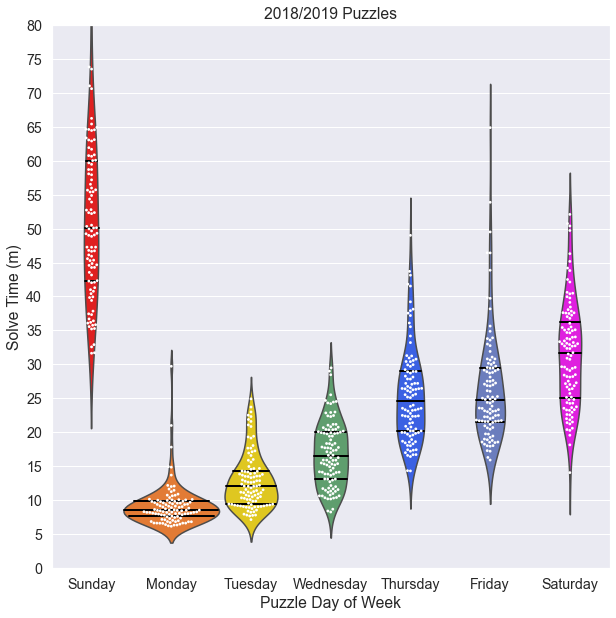

In [29]:
# Violin plots with swarm plot overlay by puzzle day 2018-2019 solves only
# Fig. 4

GMS_pre2020 = df_GMS.loc[(df_GMS["P_Yr"] == "2018") | (df_GMS["P_Yr"] == "2019")]

sns.set(font_scale=1.3)
sns.set_style("darkgrid")
plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "GMST(m)", data=GMS_pre2020 , size=2.8 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(GMS_pre2020['DOW'], GMS_pre2020['GMST(m)'], width = 1.2, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 80)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2018/2019 Puzzles")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [30]:
GMS_pre2020.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 730 entries, 1522 to 2241
Data columns (total 41 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          730 non-null    datetime64[ns]
 1   P_Date_str                      730 non-null    object        
 2   P_Yr                            730 non-null    period[A-DEC] 
 3   2023+_puzzle                    730 non-null    float64       
 4   DOW                             730 non-null    object        
 5   DOW_num                         730 non-null    float64       
 6   GMST(m)                         730 non-null    float64       
 7   GMST(m)_10p_MA                  716 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA      730 non-null    int64         
 9   GMS_pds_l40_dw                  723 non-null    float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  723 non-null    float64       
 11  GM

In [31]:
# Calculate Median and IQR per puzzle day, for 2018/2019 solves
print(GMS_pre2020.loc[(GMS_pre2020["DOW"] == "Sunday"), "GMST(m)"].describe().round(1))
print(GMS_pre2020.loc[(GMS_pre2020["DOW"] == "Monday"), "GMST(m)"].describe().round(1))
print(GMS_pre2020.loc[(GMS_pre2020["DOW"] == "Tuesday"), "GMST(m)"].describe().round(1))
print(GMS_pre2020.loc[(GMS_pre2020["DOW"] == "Wednesday"), "GMST(m)"].describe().round(1))
print(GMS_pre2020.loc[(GMS_pre2020["DOW"] == "Thursday"), "GMST(m)"].describe().round(1))
print(GMS_pre2020.loc[(GMS_pre2020["DOW"] == "Friday"), "GMST(m)"].describe().round(1))
print(GMS_pre2020.loc[(GMS_pre2020["DOW"] == "Saturday"), "GMST(m)"].describe().round(1))

count    104.0
mean      52.4
std       14.1
min       31.6
25%       42.3
50%       50.0
75%       60.0
max      110.7
Name: GMST(m), dtype: float64
count    105.0
mean       9.2
std        3.1
min        6.2
25%        7.6
50%        8.6
75%        9.8
max       29.7
Name: GMST(m), dtype: float64
count    105.0
mean      12.9
std        4.1
min        7.2
25%        9.5
50%       12.1
75%       14.3
max       24.9
Name: GMST(m), dtype: float64
count    104.0
mean      16.8
std        4.8
min        8.3
25%       13.1
50%       16.5
75%       20.1
max       29.5
Name: GMST(m), dtype: float64
count    104.0
mean      25.5
std        7.0
min       14.3
25%       20.2
50%       24.6
75%       29.0
max       49.0
Name: GMST(m), dtype: float64
count    104.0
mean      26.5
std        8.2
min       15.9
25%       21.6
50%       24.7
75%       29.5
max       64.8
Name: GMST(m), dtype: float64
count    104.0
mean      31.5
std        7.8
min       14.1
25%       25.1
50%       31.6
75%       

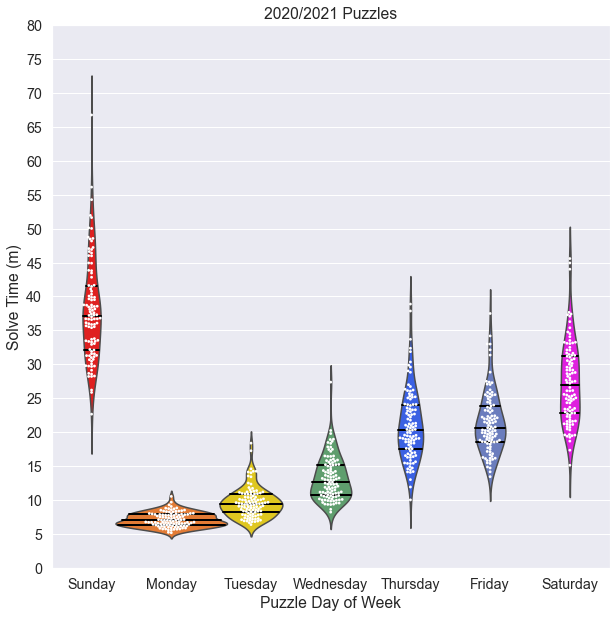

In [32]:
# Violin plots with swarm plot overlay by puzzle day 2020/2021 solves only
# Fig. 4

GMS_2020_21 = df_GMS.loc[(df_GMS["P_Yr"] == "2020") | (df_GMS["P_Yr"] == "2021")]

sns.set(font_scale=1.3)
sns.set_style("darkgrid")
plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "GMST(m)",data=GMS_2020_21 , size=2.8 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(GMS_2020_21['DOW'], GMS_2020_21['GMST(m)'], width = 1.4, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 80)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2020/2021 Puzzles")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [33]:
# Calculate Median and IQR per puzzle day, for 2020-2021 solves
print(GMS_2020_21.loc[(GMS_2020_21["DOW"] == "Sunday"), "GMST(m)"].describe().round(1))
print(GMS_2020_21.loc[(GMS_2020_21["DOW"] == "Monday"), "GMST(m)"].describe().round(1))
print(GMS_2020_21.loc[(GMS_2020_21["DOW"] == "Tuesday"), "GMST(m)"].describe().round(1))
print(GMS_2020_21.loc[(GMS_2020_21["DOW"] == "Wednesday"), "GMST(m)"].describe().round(1))
print(GMS_2020_21.loc[(GMS_2020_21["DOW"] == "Thursday"), "GMST(m)"].describe().round(1))
print(GMS_2020_21.loc[(GMS_2020_21["DOW"] == "Friday"), "GMST(m)"].describe().round(1))
print(GMS_2020_21.loc[(GMS_2020_21["DOW"] == "Saturday"), "GMST(m)"].describe().round(1))

count    104.0
mean      37.9
std        7.4
min       22.7
25%       32.2
50%       37.1
75%       41.5
max       66.7
Name: GMST(m), dtype: float64
count    104.0
mean       7.2
std        1.0
min        5.2
25%        6.4
50%        7.1
75%        7.9
max       10.6
Name: GMST(m), dtype: float64
count    104.0
mean       9.7
std        2.2
min        6.4
25%        8.2
50%        9.5
75%       10.9
max       18.4
Name: GMST(m), dtype: float64
count    105.0
mean      13.3
std        3.2
min        8.3
25%       10.8
50%       12.7
75%       15.2
max       27.4
Name: GMST(m), dtype: float64
count    105.0
mean      21.1
std        5.2
min       10.1
25%       17.6
50%       20.3
75%       24.1
max       38.9
Name: GMST(m), dtype: float64
count    105.0
mean      21.5
std        4.5
min       13.5
25%       18.6
50%       20.7
75%       23.9
max       37.5
Name: GMST(m), dtype: float64
count    104.0
mean      27.3
std        5.9
min       15.2
25%       22.8
50%       26.9
75%       

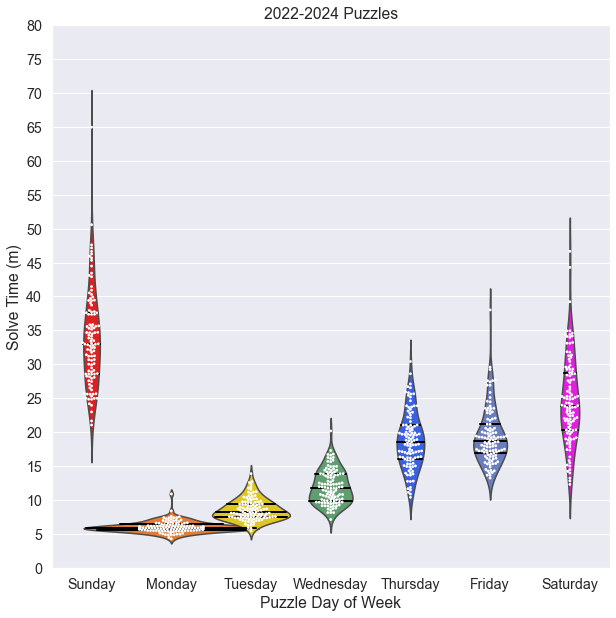

In [34]:
# Violin plots with swarm plot overlay by puzzle day -2022-2024
# Fig. 4

GMS_2022_24 = df_GMS.loc[(df_GMS["P_Yr"] == "2022") | (df_GMS["P_Yr"] == "2023") | (df_GMS["P_Yr"] == "2024")]

sns.set(font_scale=1.3)
sns.set_style("darkgrid")
plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "GMST(m)",data=GMS_2022_24 , size=2.8, order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(GMS_2022_24['DOW'], GMS_2022_24['GMST(m)'], width = 2.2, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 80)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2022-2024 Puzzles")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [35]:
# Calculate Median and IQR per puzzle day, for 2022/2024
print(GMS_2022_24.loc[(GMS_2022_24["DOW"] == "Sunday"), "GMST(m)"].describe().round(1))
print(GMS_2022_24.loc[(GMS_2022_24["DOW"] == "Monday"), "GMST(m)"].describe().round(1))
print(GMS_2022_24.loc[(GMS_2022_24["DOW"] == "Tuesday"), "GMST(m)"].describe().round(1))
print(GMS_2022_24.loc[(GMS_2022_24["DOW"] == "Wednesday"), "GMST(m)"].describe().round(1))
print(GMS_2022_24.loc[(GMS_2022_24["DOW"] == "Thursday"), "GMST(m)"].describe().round(1))
print(GMS_2022_24.loc[(GMS_2022_24["DOW"] == "Friday"), "GMST(m)"].describe().round(1))
print(GMS_2022_24.loc[(GMS_2022_24["DOW"] == "Saturday"), "GMST(m)"].describe().round(1))

count    112.0
mean      33.7
std        7.0
min       21.1
25%       28.6
50%       33.0
75%       37.6
max       64.9
Name: GMST(m), dtype: float64
count    112.0
mean       6.1
std        0.8
min        4.3
25%        5.6
50%        6.0
75%        6.4
max       11.0
Name: GMST(m), dtype: float64
count    112.0
mean       8.6
std        1.6
min        5.5
25%        7.5
50%        8.3
75%        9.5
max       13.9
Name: GMST(m), dtype: float64
count    112.0
mean      12.0
std        2.5
min        7.2
25%       10.0
50%       11.8
75%       13.9
max       20.2
Name: GMST(m), dtype: float64
count    112.0
mean      18.8
std        4.1
min       10.4
25%       16.1
50%       18.5
75%       21.1
max       30.4
Name: GMST(m), dtype: float64
count    112.0
mean      19.5
std        4.1
min       13.3
25%       16.9
50%       18.8
75%       21.2
max       38.0
Name: GMST(m), dtype: float64
count    113.0
mean      24.7
std        6.4
min       12.4
25%       20.4
50%       23.9
75%       

### Constructor Analysis
Which constructors does the GMS struggle against? Which ones does the GMS do well against? This analysis is with respect to average deviation for solve performance on given puzzle from recent (time-weighted) performance per constructor/constructor team. 

In [40]:
#Get by-constructor performance stats for Global Median Solver
constructor_avgs_GMS = df_GMS.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].agg(constructor_mean_GMS=(np.mean), puzzle_count_GMS=(np.count_nonzero))
constructor_avgs_GMS["constructor_mean_GMS"] = constructor_avgs_GMS["constructor_mean_GMS"].round(2)

puzzle_min_threshold = 5 #min number of puzzles in sample for constructor/constructor team to be kept in the analysis 

# Pare down to only constructor(s) with at least n puzzles for which GMS has completed
constructor_avgs_filter = constructor_avgs_GMS.loc[constructor_avgs_GMS['puzzle_count_GMS'] >= puzzle_min_threshold] 

In [41]:
constructor_avgs_filter.head(35)

,constructor_mean_GMS,puzzle_count_GMS
Constructors,,
Adam Aaronson,-16.17,8.0
Adam Wagner,-3.43,15.0
Adrian Johnson,-8.16,5.0
Aimee Lucido,-14.79,9.0
Alan Arbesfeld,10.66,12.0
Alex Bajcz,-13.37,5.0
Alex Eaton-Salners,3.69,38.0
Alex Vratsanos,8.01,5.0
Amanda Chung and Karl Ni,-16.14,10.0


In [42]:
constructor_avgs_filter.info()

<class 'pandas.core.frame.DataFrame'>
Index: 117 entries, Adam Aaronson to Zhouqin Burnikel
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   constructor_mean_GMS  117 non-null    float64
 1   puzzle_count_GMS      117 non-null    float64
dtypes: float64(2)
memory usage: 2.7+ KB


In [39]:
constructor_avgs_filter.to_csv('../data/constructor_avgs_filter.csv', index=True)

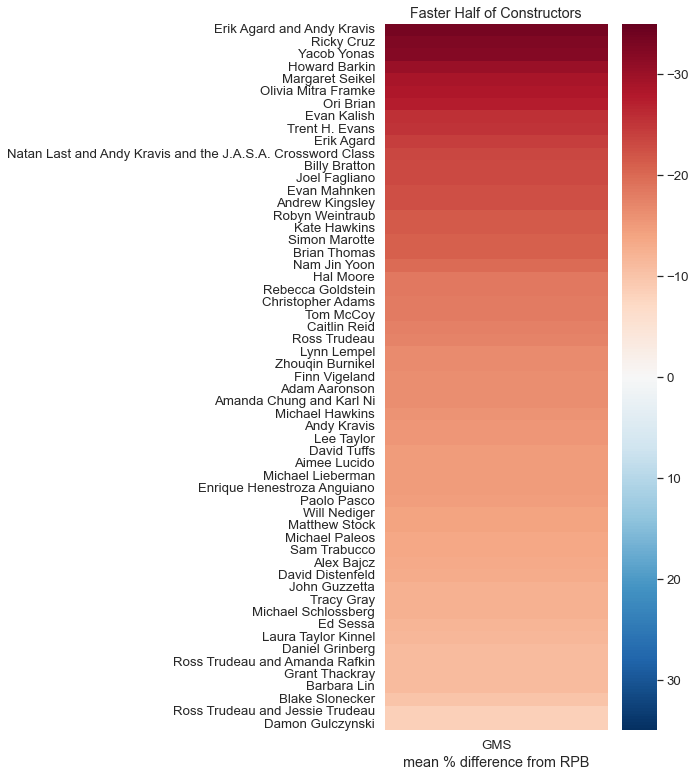

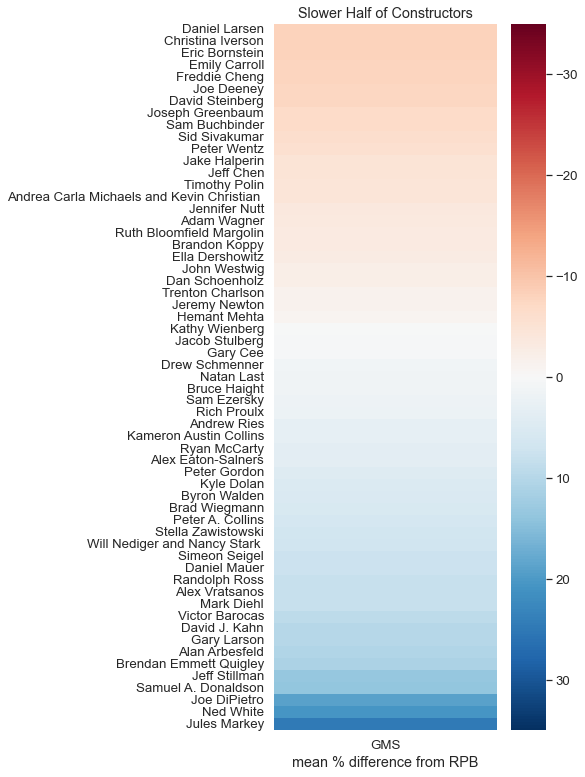

In [43]:
# Construct Heat Map sorted by fastest constructor relative to GMS 10 puzzle moving average to slowest
# Fig. 5

#Remove puzzle ns columns and sort for heatmapping
avgs = constructor_avgs_filter[["constructor_mean_GMS"]]
avgs = avgs.sort_values(by=['constructor_mean_GMS'], ascending = True)

first_half_end = int((len(avgs)/2)-1)
avgs_end = int(len(avgs))
first_half = avgs[0:first_half_end]
second_half = avgs[(first_half_end+1):avgs_end]

first_half = first_half.sort_values(by=['constructor_mean_GMS'], ascending = True)
plt.figure(figsize=(5,13))
sns.set(font_scale=1.2)
ax = sns.heatmap(first_half, xticklabels=['GMS'], cmap="RdBu", vmin=-35, vmax=35, yticklabels=True)
plt.gcf().axes[1].invert_yaxis() #flip color bar to show fastest at the top
plt.xlabel('mean % difference from RPB')
plt.ylabel('')
plt.title("Faster Half of Constructors")
plt.show()

second_half = second_half.sort_values(by=['constructor_mean_GMS'], ascending = True)
plt.figure(figsize=(5,13))
sns.set(font_scale=1.2)
ax2 = sns.heatmap(second_half, xticklabels=['GMS'], cmap="RdBu",vmin=-35, vmax=35, yticklabels=True)
plt.gcf().axes[1].invert_yaxis() #flip color bar to show fastest at the top
plt.xlabel('mean % difference from RPB')
plt.ylabel('')
plt.title("Slower Half of Constructors")
plt.show()

In [44]:
print(constructor_avgs_filter[["constructor_mean_GMS"]].agg(['min', 'max']))

     constructor_mean_GMS
min                -33.50
max                 24.67


#### Figure 6: "Prediction" of Next Performance vs a Constructor Based on Previous at Different Inclusion Thresholds

In [45]:
# Calculate past performance (using COMP date to sort) for GMS against a given constructor (% difference from RPB) for each puzzle in sample
# GMS mean past performance versus a given constructor(s), per puzzle. 
# This is calculated off of deviation from RPB, so that it can be collapsed across puzzle days
# Getting the count as well will allow filtering by past number of puzzles for a second and third version of the figure

df_GMS = df_GMS.sort_values(by=['Constructors','P_Date'], ascending = False)

df_GMS = df_GMS.iloc[::-1]
df_GMS['GMS_per_constr_avg_past_diff_from_RPB'] = df_GMS.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).mean().round(2).shift(1))
df_GMS['GMS_per_constr_past_diff_from_RPB_ct'] = df_GMS.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).count().shift(1))
df_GMS = df_GMS.iloc[::-1]

# col = df_GMS.pop('GMS_per_constr_avg_past_diff_from_10pMA')
# df_GMS.insert(17, col.name, col)

In [46]:
# Checkpoint
df_GMS.to_csv('../data/df_GMS.csv', index=False)

In [47]:
# Create df that includes only puzzles with Constructor(s) where there are >=1 prior puzzles by them
df_GMS_filter = df_GMS.loc[(df_GMS["GMS_per_constr_past_diff_from_RPB_ct"] >= 1)]
df_GMS_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1488 entries, 141 to 360
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1488 non-null   datetime64[ns]
 1   P_Date_str                             1488 non-null   object        
 2   P_Yr                                   1488 non-null   period[A-DEC] 
 3   2023+_puzzle                           1488 non-null   float64       
 4   DOW                                    1488 non-null   object        
 5   DOW_num                                1488 non-null   float64       
 6   GMST(m)                                1488 non-null   float64       
 7   GMST(m)_10p_MA                         1488 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1488 non-null   int64         
 9   GMS_pds_l40_dw                         1488 non-null   float64

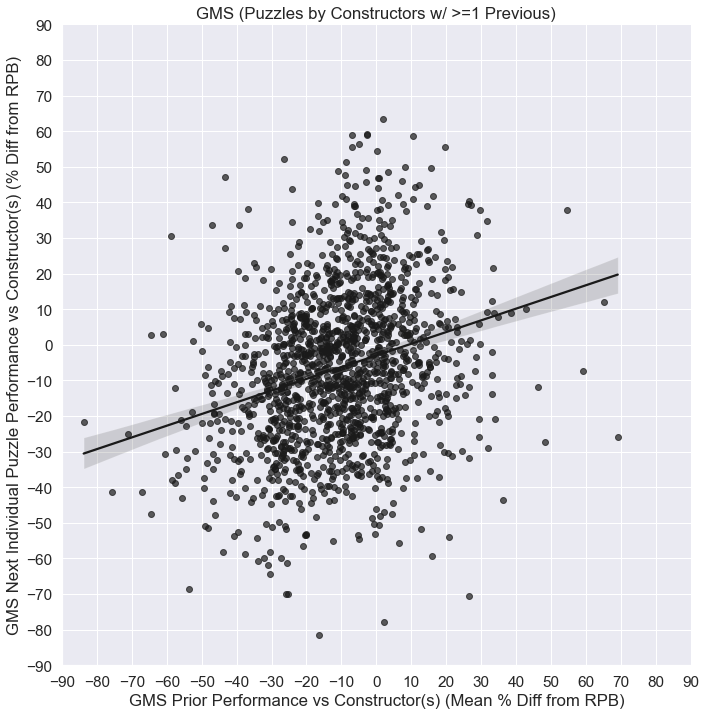

In [48]:
# Idea here GMS to get correlation between past performance vs a given constructor and performance on a given puzzle, in a way that GMS normalized for both puzzle day difficulty and recent past performance
#Fig. 6
sns.set(font_scale=1.4)

p = sns.lmplot(
    data=df_GMS_filter, x="GMS_per_constr_avg_past_diff_from_RPB", y="GMST_Diff%_from_GMS_pds_l40_dw",
    height=10, aspect=1, legend=False, scatter_kws = {"color": "k", "alpha": 0.7}, line_kws = {"color": "k"}
).set(title="GMS (Puzzles by Constructors w/ >=1 Previous)", xlabel= "GMS Prior Performance vs Constructor(s) (Mean % Diff from RPB)",
    ylabel="GMS Next Individual Puzzle Performance vs Constructor(s) (% Diff from RPB)", xticks =[-90, -80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90], yticks =[-90, -80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90]
)

# #Adjust subplots individually
_= p.set(ylim=(-90, 90))
_= p.set(xlim=(-90, 90))

In [49]:
# Correlation Calculation (Pearson r)
print(df_GMS_filter['GMS_per_constr_avg_past_diff_from_RPB'].corr(df_GMS_filter['GMST_Diff%_from_GMS_pds_l40_dw']))

0.26977587273889053


In [50]:
# Create df that includes only puzzles with Constructor(s) where there are >=4 prior puzzles by them
df_GMS_filter = df_GMS.loc[(df_GMS["GMS_per_constr_past_diff_from_RPB_ct"] >= 4)]
df_GMS_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 761 entries, 753 to 789
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 761 non-null    datetime64[ns]
 1   P_Date_str                             761 non-null    object        
 2   P_Yr                                   761 non-null    period[A-DEC] 
 3   2023+_puzzle                           761 non-null    float64       
 4   DOW                                    761 non-null    object        
 5   DOW_num                                761 non-null    float64       
 6   GMST(m)                                761 non-null    float64       
 7   GMST(m)_10p_MA                         761 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             761 non-null    int64         
 9   GMS_pds_l40_dw                         761 non-null    float64 

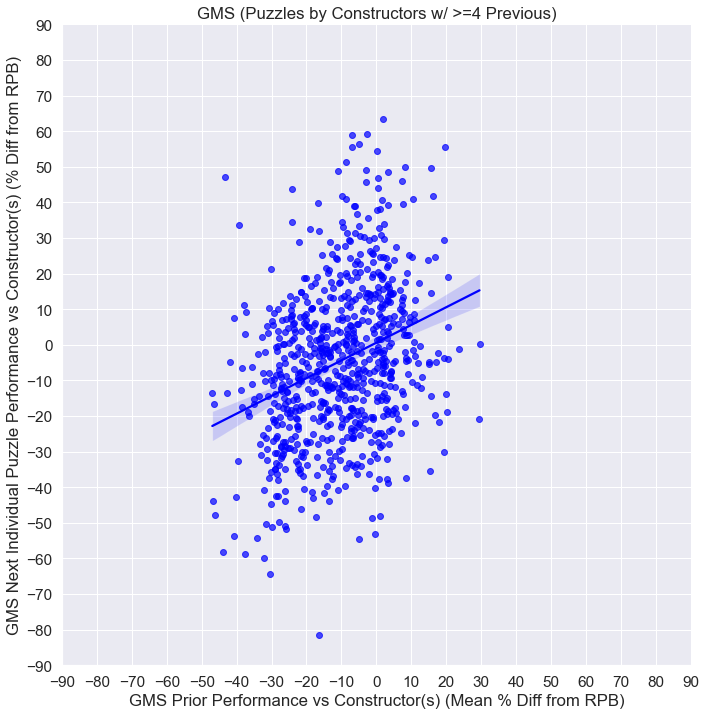

In [51]:
# Idea here GMS to get correlation between past performance vs a given constructor and performance on a given puzzle, in a way that GMS normalized for both puzzle day difficulty and recent past performance
#Fig. 6
sns.set(font_scale=1.4)

p = sns.lmplot(
    data=df_GMS_filter, x="GMS_per_constr_avg_past_diff_from_RPB", y="GMST_Diff%_from_GMS_pds_l40_dw",
    height=10, aspect=1, legend=False, scatter_kws = {"color": "blue", "alpha": 0.7}, line_kws = {"color": "blue"}
).set(title="GMS (Puzzles by Constructors w/ >=4 Previous)", xlabel= "GMS Prior Performance vs Constructor(s) (Mean % Diff from RPB)",
    ylabel="GMS Next Individual Puzzle Performance vs Constructor(s) (% Diff from RPB)", xticks =[-90, -80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90], yticks =[-90, -80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90]
)

# #Adjust subplots individually
_= p.set(ylim=(-90, 90))
_= p.set(xlim=(-90, 90))

In [52]:
# Correlation Calculation (Pearson r)
print(df_GMS_filter['GMS_per_constr_avg_past_diff_from_RPB'].corr(df_GMS_filter['GMST_Diff%_from_GMS_pds_l40_dw']))

0.31206586635252115


### Correlation of Puzzle, Answer and Past Performance Feature Parameters to Individual GMS Puzzle Solve Times 

In [53]:
# Make a deep copy of individual solver df
GMS_df3 = df_GMS.copy()

In [54]:
GMS_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2246 entries, 141 to 894
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 2246 non-null   datetime64[ns]
 1   P_Date_str                             2246 non-null   object        
 2   P_Yr                                   2246 non-null   period[A-DEC] 
 3   2023+_puzzle                           2246 non-null   float64       
 4   DOW                                    2246 non-null   object        
 5   DOW_num                                2246 non-null   float64       
 6   GMST(m)                                2246 non-null   float64       
 7   GMST(m)_10p_MA                         2232 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             2246 non-null   int64         
 9   GMS_pds_l40_dw                         2239 non-null   float64

In [51]:
#GMS_df3a.to_csv('../data/GMS_df3a.csv', index=False)

NameError: name 'GMS_df3a' is not defined

In [55]:
# Restricting time range to beginning of 2019 onward to minimize baseline shift effects on correlations to puzzle features

GMS_df4 = GMS_df3.loc[(GMS_df3["P_Yr"]==("2019")) | (GMS_df3["P_Yr"]==("2020")) | (GMS_df3["P_Yr"]==("2021")) |(GMS_df3["P_Yr"]==("2022")) | (GMS_df3["P_Yr"]==("2023")) | (GMS_df3["P_Yr"]==("2024"))]
#GMS_df4 = GMS_df3.loc[(GMS_df3["P_Yr"]==("2020")) | (GMS_df3["P_Yr"]==("2021")) |(GMS_df3["P_Yr"]==("2022")) | (GMS_df3["P_Yr"]==("2023")) | (GMS_df3["P_Yr"]==("2024"))]
# #print(df_IS1.loc[df_IS1["Comp_Yr"]==("2021"), "IST(m)"].sum())

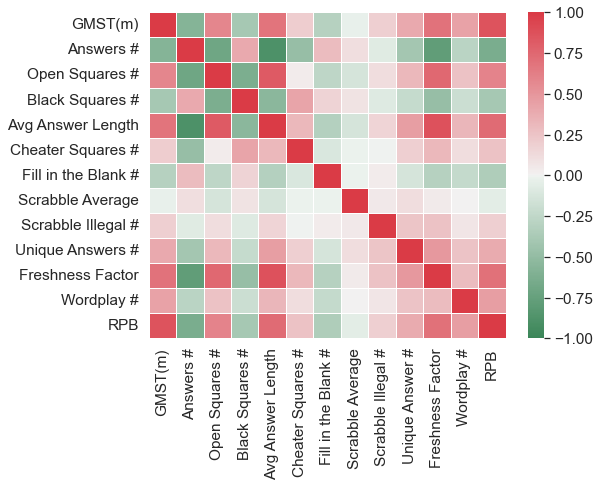

In [56]:
# 15x15 Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. 7

GMS_15x15 = GMS_df4.loc[GMS_df4["DOW"]!=("Sunday")]
puzzle_features = GMS_15x15[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',    
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'GMS_pds_l40_dw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triangle - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #','RPB'])
#_= ans.set_yticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Average Answer Length', 'Rebus #', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Recent Adj Perf', 'Past Perf vs Constructor(s)'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [57]:
GMS_15x15.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1613 entries, 141 to 894
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1613 non-null   datetime64[ns]
 1   P_Date_str                             1613 non-null   object        
 2   P_Yr                                   1613 non-null   period[A-DEC] 
 3   2023+_puzzle                           1613 non-null   float64       
 4   DOW                                    1613 non-null   object        
 5   DOW_num                                1613 non-null   float64       
 6   GMST(m)                                1613 non-null   float64       
 7   GMST(m)_10p_MA                         1613 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1613 non-null   int64         
 9   GMS_pds_l40_dw                         1613 non-null   float64

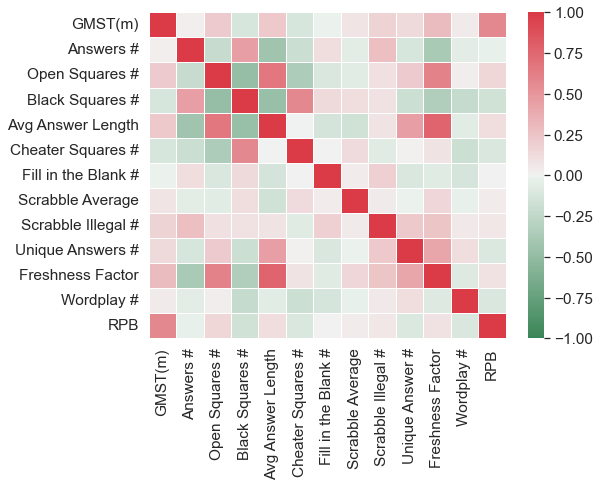

In [58]:
# 21x21 (Sunday) Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. 7

GMS_21x21 = GMS_df4.loc[GMS_df4["DOW"]==("Sunday")]
puzzle_features = GMS_21x21[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',     
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'GMS_pds_l40_dw': 'RPB'    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [59]:
GMS_21x21.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 268 entries, 1875 to 1812
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 268 non-null    datetime64[ns]
 1   P_Date_str                             268 non-null    object        
 2   P_Yr                                   268 non-null    period[A-DEC] 
 3   2023+_puzzle                           268 non-null    float64       
 4   DOW                                    268 non-null    object        
 5   DOW_num                                268 non-null    float64       
 6   GMST(m)                                268 non-null    float64       
 7   GMST(m)_10p_MA                         268 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             268 non-null    int64         
 9   GMS_pds_l40_dw                         268 non-null    float6

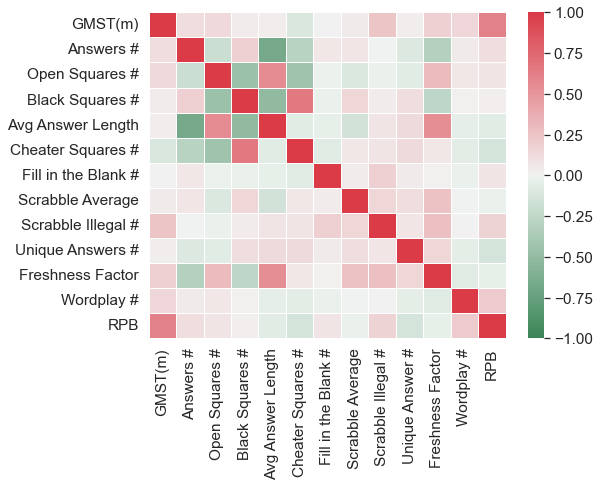

In [66]:
# Monday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. S1

GMS_df4_Mon = GMS_df4.loc[GMS_df4["DOW"]==("Monday")]
puzzle_features = GMS_df4_Mon[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'GMS_pds_l40_dw': 'RPB',    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [67]:
GMS_df4_Mon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 268 entries, 168 to 889
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 268 non-null    datetime64[ns]
 1   P_Date_str                             268 non-null    object        
 2   P_Yr                                   268 non-null    period[A-DEC] 
 3   2023+_puzzle                           268 non-null    float64       
 4   DOW                                    268 non-null    object        
 5   DOW_num                                268 non-null    float64       
 6   GMST(m)                                268 non-null    float64       
 7   GMST(m)_10p_MA                         268 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             268 non-null    int64         
 9   GMS_pds_l40_dw                         268 non-null    float64 

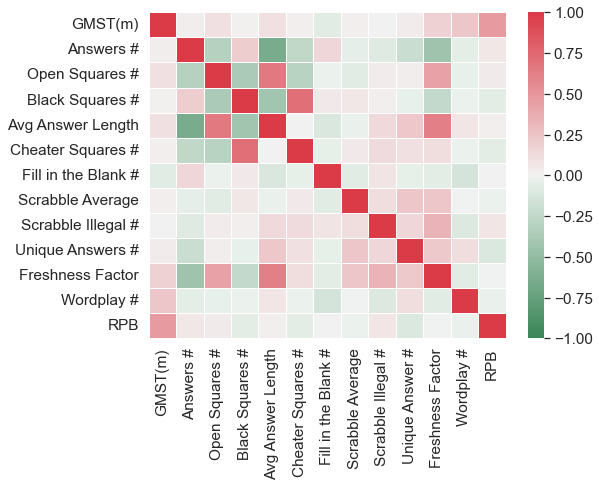

In [68]:
# Tuesday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. S1

GMS_df4_Tue = GMS_df4.loc[GMS_df4["DOW"]==("Tuesday")]
puzzle_features = GMS_df4_Tue[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay': 'Wordplay #',
'GMS_pds_l40_dw': 'RPB'    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

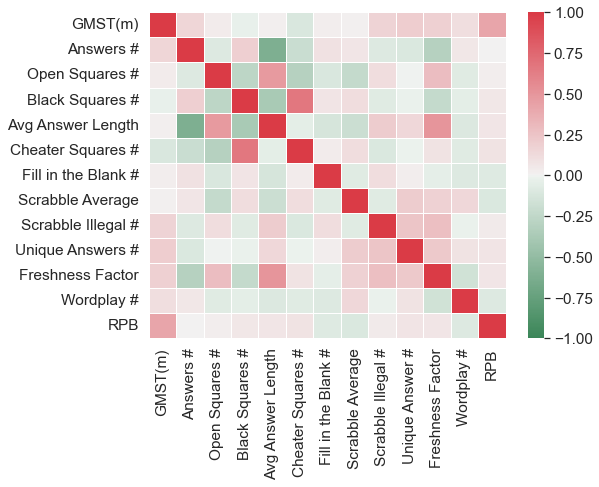

In [69]:
# Wednesday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. S1

GMS_df4_Wed = GMS_df4.loc[GMS_df4["DOW"]==("Wednesday")]
puzzle_features = GMS_df4_Wed[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay': 'Wordplay #',
'GMS_pds_l40_dw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

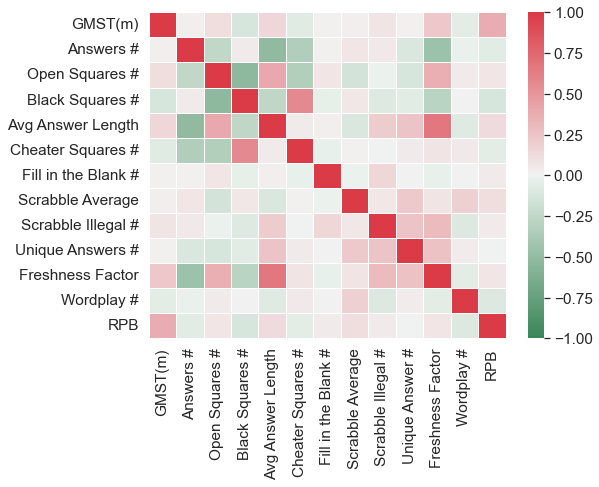

In [70]:
# Thursday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. S1

GMS_df4_Thurs = GMS_df4.loc[GMS_df4["DOW"]==("Thursday")]
puzzle_features = GMS_df4_Thurs[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length', 
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'GMS_pds_l40_dw': 'RPB',    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])
#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

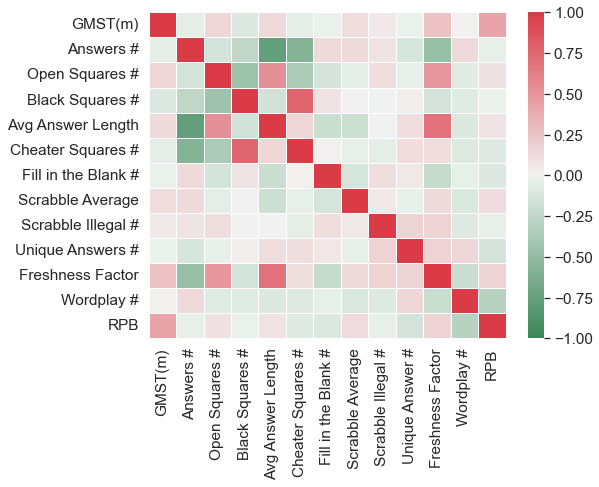

In [71]:
# Friday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. S1

GMS_df4_Fri = GMS_df4.loc[GMS_df4["DOW"]==("Friday")]
puzzle_features = GMS_df4_Fri[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'GMS_pds_l40_dw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

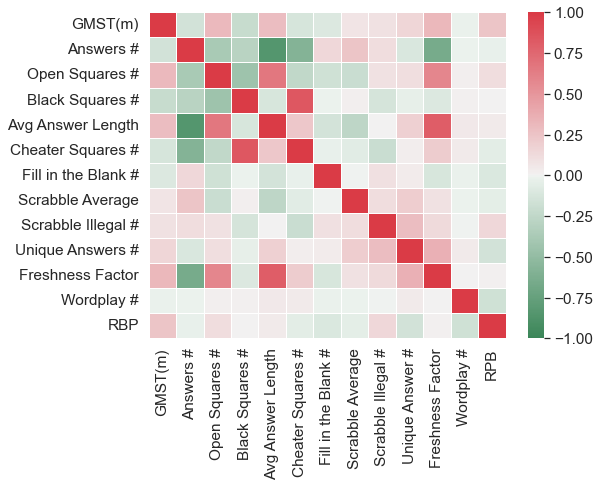

In [72]:
# Saturday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. S1

GMS_df4_Sat = GMS_df4.loc[GMS_df4["DOW"]==("Saturday")]
puzzle_features = GMS_df4_Sat[["GMST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "GMS_pds_l40_dw"]]

corr = puzzle_features.corr()

labels = {
'GMST(m)':'GMST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill in the Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'GMS_pds_l40_dw': 'RBP'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['GMST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

### Scatterplots of Relationship of Grid, Answer and Past-Performance Parameters to GMS Per Puzzle Performance

In [60]:
GMS_df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1881 entries, 141 to 894
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1881 non-null   datetime64[ns]
 1   P_Date_str                             1881 non-null   object        
 2   P_Yr                                   1881 non-null   period[A-DEC] 
 3   2023+_puzzle                           1881 non-null   float64       
 4   DOW                                    1881 non-null   object        
 5   DOW_num                                1881 non-null   float64       
 6   GMST(m)                                1881 non-null   float64       
 7   GMST(m)_10p_MA                         1881 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1881 non-null   int64         
 9   GMS_pds_l40_dw                         1881 non-null   float64

In [61]:
# Create new df with all 15x15 puzzle rows copied and placed below current rows. 
# This is so we can plot all 15x15 data together as a subplot in the feature correlation scatterplot figures 

GMS_df4_copy = GMS_df4.loc[(GMS_df4["DOW_num"] != 1)] #15x15 only
GMS_df4_copy["DOW_num"] = 0

GMS_df4a = pd.concat([GMS_df4, GMS_df4_copy],ignore_index=True)

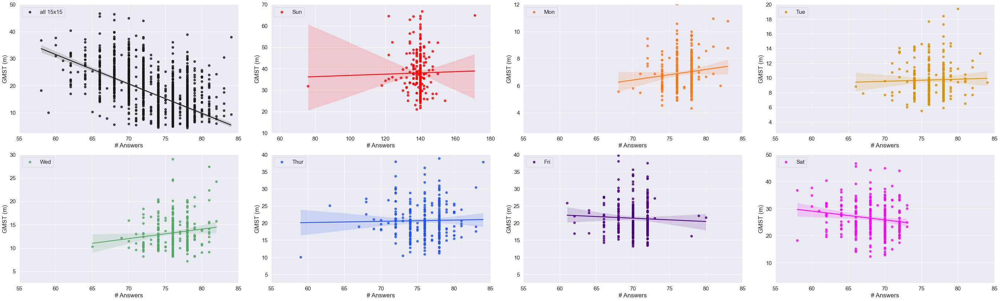

In [62]:
# Number of Answers vs GMS Raw Solve Times
# Non-normalized version
# Fig. 8

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Words", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Answers",
    ylabel="GMST (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((55,85))
p.axes[1].set_xlim((55,180))
p.axes[2].set_xlim((55,85))
p.axes[3].set_xlim((55,85))
p.axes[4].set_xlim((55,85))
p.axes[5].set_xlim((55,85))
p.axes[6].set_xlim((55,85))
p.axes[7].set_xlim((55,85))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

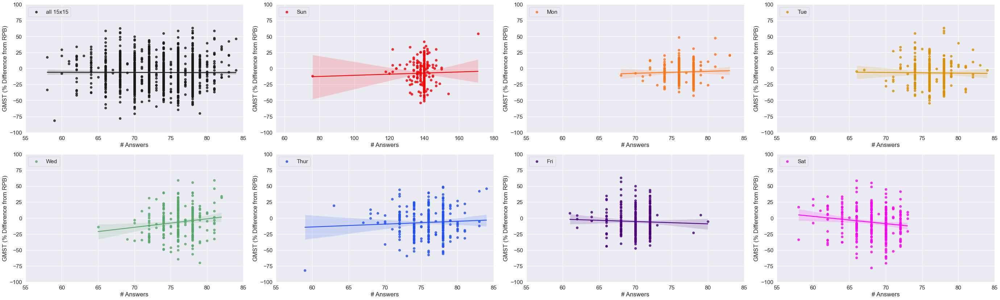

In [63]:
# Number of Answers vs GMS Raw Solve Times
# Puzzle Days normed to RPB for that day
# Fig. 8

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Words", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Answers",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((55,85))
p.axes[1].set_xlim((55,180))
p.axes[2].set_xlim((55,85))
p.axes[3].set_xlim((55,85))
p.axes[4].set_xlim((55,85))
p.axes[5].set_xlim((55,85))
p.axes[6].set_xlim((55,85))
p.axes[7].set_xlim((55,85))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [64]:
# Calculate GMS Pearson R for 15x15 grids for this feature
GMS_15x15 = GMS_df4.loc[GMS_df4["DOW"]!=("Sunday")] #only need to filter down this one time, and can apply to correlations for all subsequent features analysed

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Words']))

-0.5735495946402125


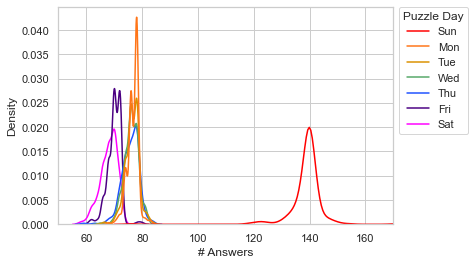

In [65]:
# Density plot of number of answers in puzzles solved by GMS
# Fig. 8

GMS_df4['plot_seq_map'] = GMS_df4['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Words", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(50, 170)
ax.set_xlabel("# Answers")
plt.show()

In [66]:
GMS_df4["Words"].agg(['min', 'max'])

min     58
max    171
Name: Words, dtype: int64

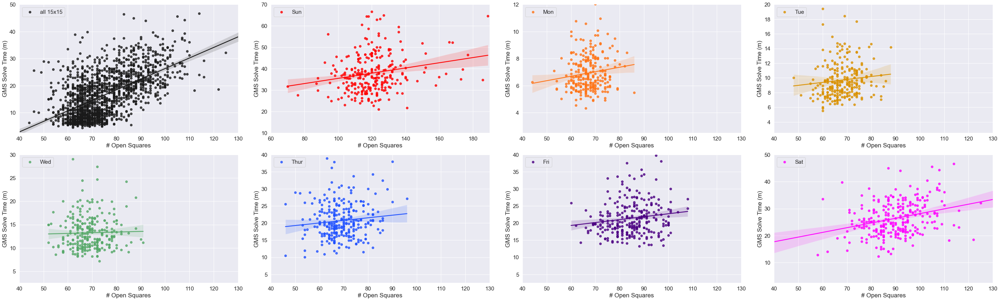

In [67]:
# Open Squares vs GMS Raw Solve Times
# Non-normalized version
# Fig. 9

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Open_Squares", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Open Squares",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((40,130))
p.axes[1].set_xlim((60,190))
p.axes[2].set_xlim((40,130))
p.axes[3].set_xlim((40,130))
p.axes[4].set_xlim((40,130))
p.axes[5].set_xlim((40,130))
p.axes[6].set_xlim((40,130))
p.axes[7].set_xlim((40,130))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

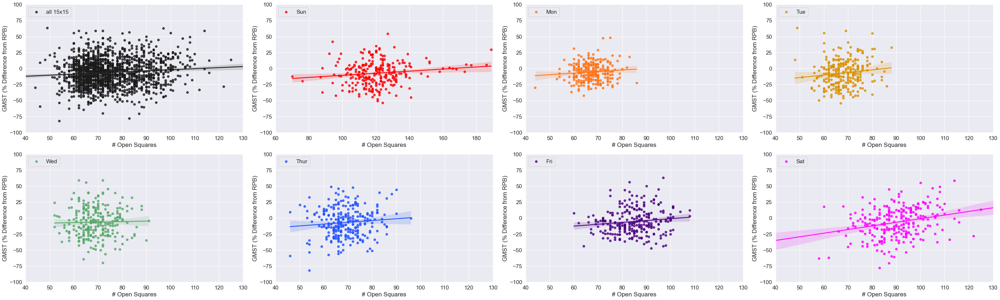

In [68]:
# Open Squares vs GMS Raw Solve Times
# Puzzle Days normed to RPB for that day
# Fig. 9

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Open_Squares", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Open Squares",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((40,130))
p.axes[1].set_xlim((60,190))
p.axes[2].set_xlim((40,130))
p.axes[3].set_xlim((40,130))
p.axes[4].set_xlim((40,130))
p.axes[5].set_xlim((40,130))
p.axes[6].set_xlim((40,130))
p.axes[7].set_xlim((40,130))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [69]:
# Calculate GMS Pearson R for 15x15 grids for this feature
#GMS_15x15 = GMS_df3.loc[GMS_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Open_Squares']))

0.584023257995083


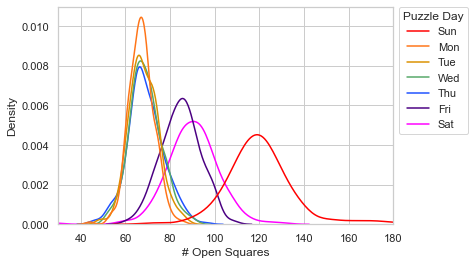

In [70]:
# Density plot of number of open squares in puzzles solved by GMS
# Fig. 9

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Open_Squares", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(30, 180)
ax.set_xlabel("# Open Squares")
plt.show()

In [71]:
GMS_df4["Open_Squares"].agg(['min', 'max'])

min     29
max    189
Name: Open_Squares, dtype: int64

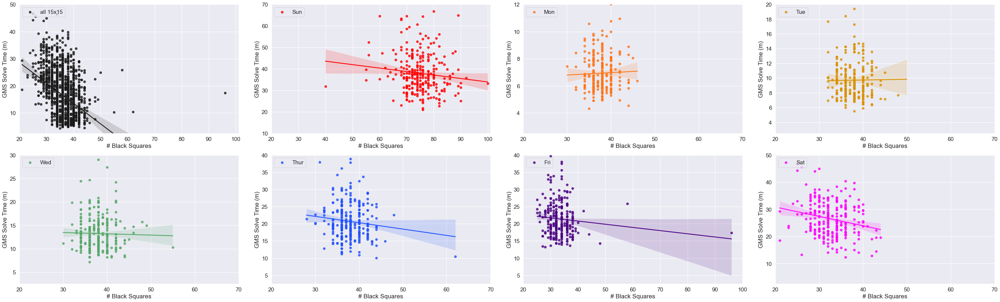

In [72]:
# Black Squares (blocks) vs GMS Raw Solve Times
#Non-normed version
# Fig. 10

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Blocks", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Black Squares",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((20,101))
p.axes[1].set_xlim((20,101))
p.axes[2].set_xlim((20,70))
p.axes[3].set_xlim((20,70))
p.axes[4].set_xlim((20,70))
p.axes[5].set_xlim((20,70))
p.axes[6].set_xlim((20,100))
p.axes[7].set_xlim((20,70))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

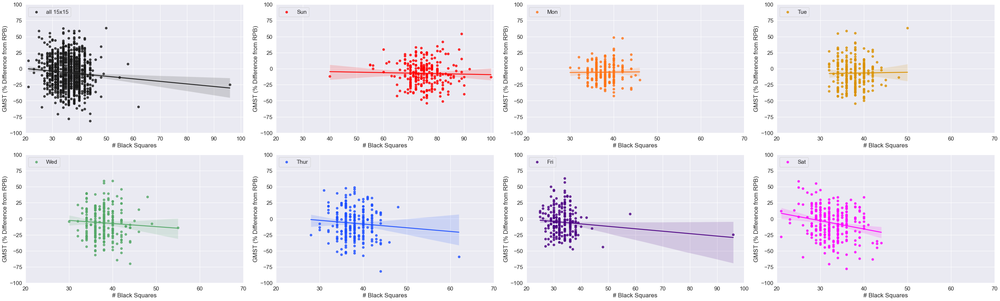

In [73]:
# Black Squares (blocks) vs GMS Raw Solve Times
#RPB normed version
# Fig. 10

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Blocks", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Black Squares",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((20,101))
p.axes[1].set_xlim((20,101))
p.axes[2].set_xlim((20,70))
p.axes[3].set_xlim((20,70))
p.axes[4].set_xlim((20,70))
p.axes[5].set_xlim((20,70))
p.axes[6].set_xlim((20,100))
p.axes[7].set_xlim((20,70))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [74]:
# Calculate Pearson R for GMS 15x15 grids for this feature
#GMS_15x15 = GMS_df3.loc[GMS_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Blocks']))

-0.39428872179725166


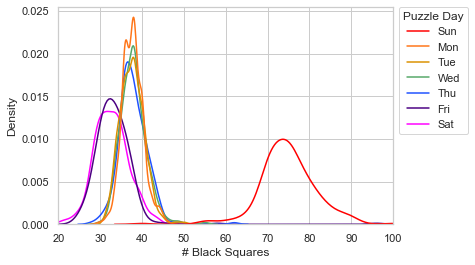

In [75]:
# Density plot of number of black squares (blocks) in puzzles solved by GMS
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together
# Fig. 10

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Blocks", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(20, 100)
ax.set_xlabel("# Black Squares")
plt.show()

In [76]:
GMS_df4["Blocks"].agg(['min', 'max'])

min     21
max    100
Name: Blocks, dtype: int64

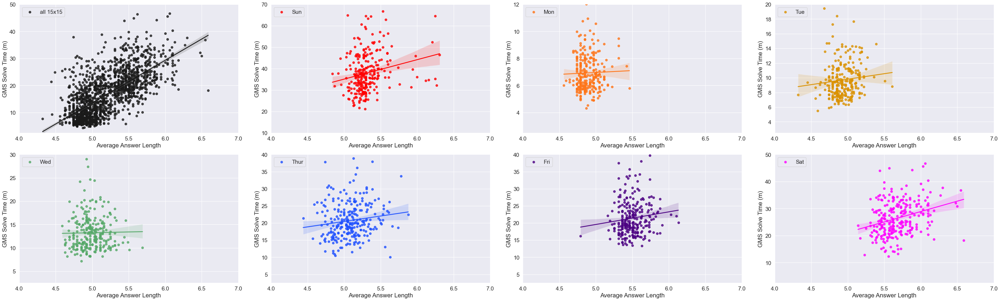

In [77]:
# Average Answer Length vs GMS Raw Solve Times
#Non-normed version
# Fig. 11

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="AWL", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Average Answer Length",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((4,7))
p.axes[1].set_xlim((4,7))
p.axes[2].set_xlim((4,7))
p.axes[3].set_xlim((4,7))
p.axes[4].set_xlim((4,7))
p.axes[5].set_xlim((4,7))
p.axes[6].set_xlim((4,7))
p.axes[7].set_xlim((4,7))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

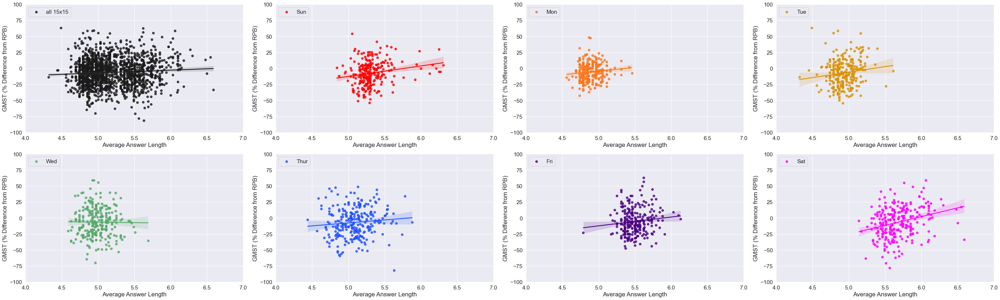

In [78]:
# Average Answer Length vs GMS Raw Solve Times
#RPB-normed version
# Fig. 11

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="AWL", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Average Answer Length",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((4,7))
p.axes[1].set_xlim((4,7))
p.axes[2].set_xlim((4,7))
p.axes[3].set_xlim((4,7))
p.axes[4].set_xlim((4,7))
p.axes[5].set_xlim((4,7))
p.axes[6].set_xlim((4,7))
p.axes[7].set_xlim((4,7))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [79]:
# Calculate Pearson R for GMST for 15x15 grids for this feature
#GMST_15x15 = GMST_df3.loc[GMST_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['AWL']))

0.6834541552505866


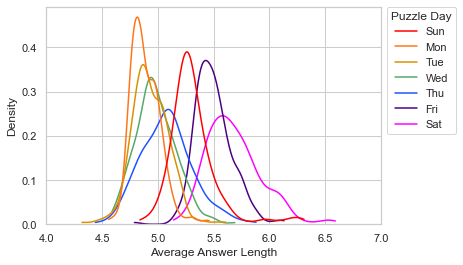

In [80]:
# Density plot of average answer length in puzzles solved by GMS
# Fig. 11

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "AWL", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(3,7))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(4, 7)
ax.set_xlabel("Average Answer Length")
plt.show()

In [81]:
GMS_df4["AWL"].agg(['min', 'max'])

min    4.32
max    6.59
Name: AWL, dtype: float64

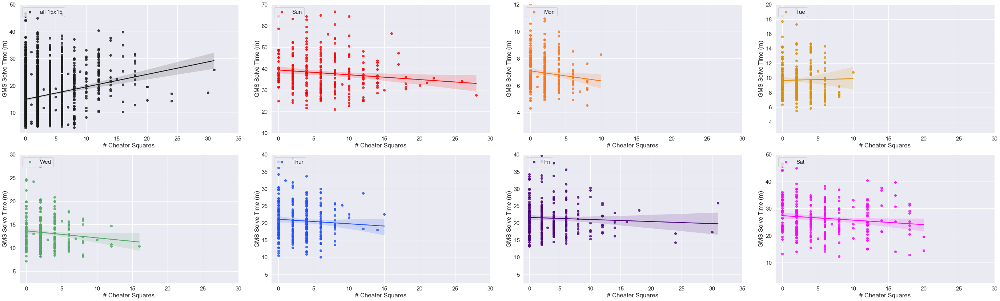

In [82]:
# Cheater Squares vs GMS Raw Solve Times
# Fig. 12

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Cheater_Squares", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Cheater Squares",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,35))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,35))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

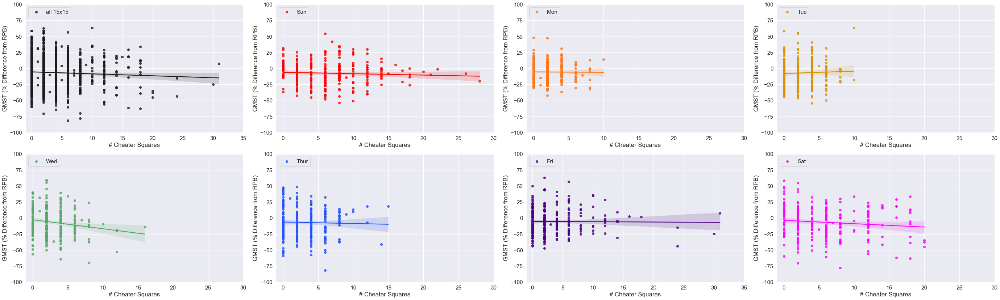

In [83]:
# Cheater Squares vs GMS Raw Solve Times
#RPB-normalized version
# Fig. 12

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Cheater_Squares", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Cheater Squares",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,35))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,35))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [84]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#GMS_15x15 = GMS_df3.loc[GMS_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Cheater_Squares']))

0.20288603276901193


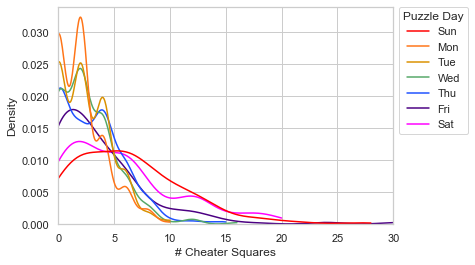

In [85]:
# Density plot of number of cheater squares in puzzles solved by GMS
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together
# Fig. 12

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Cheater_Squares", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,30))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 30)
ax.set_xlabel("# Cheater Squares")
plt.show()

In [86]:
GMS_df4["Cheater_Squares"].agg(['min', 'max'])

min     0
max    31
Name: Cheater_Squares, dtype: int64

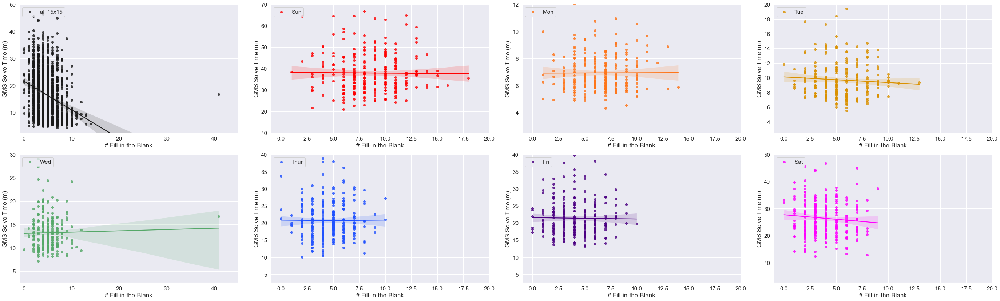

In [87]:
# Fill-in-the-blank clues vs GMS Raw Solve Times
# Fig. 13

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="FITB", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Fill-in-the-Blank",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,45))
p.axes[1].set_xlim((-1,20))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,45))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

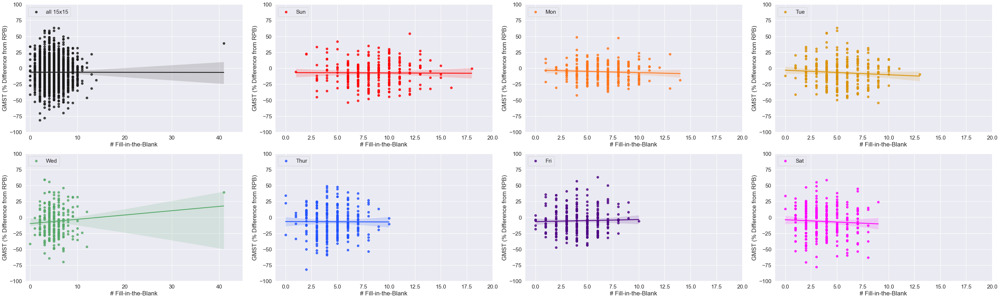

In [88]:
# Fill-in-the-blank clues vs GMS Raw Solve Times
# RPB-normalized version
# Fig. 13

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="FITB", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Fill-in-the-Blank",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,45))
p.axes[1].set_xlim((-1,20))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,45))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [89]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#GMS_15x15 = GMS_df3.loc[GMS_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['FITB']))

-0.3093112878331917


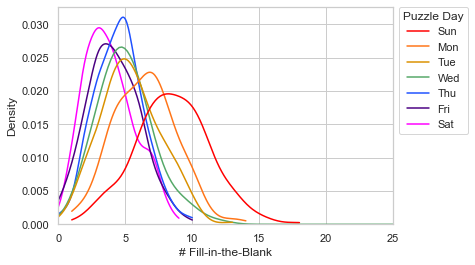

In [90]:
# Density plot of number of fill-in-the-blank clues in puzzles solved by GMS
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together
# Fig. 13

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "FITB", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,45))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 25)
ax.set_xlabel("# Fill-in-the-Blank")
plt.show()

In [91]:
GMS_df4["FITB"].agg(['min', 'max'])

min     0
max    41
Name: FITB, dtype: int64

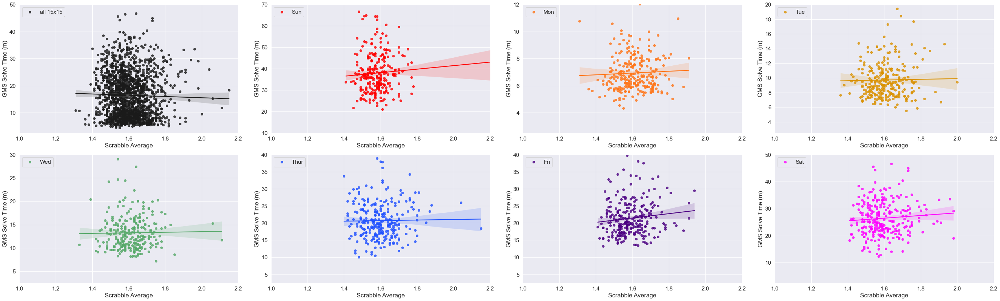

In [92]:
# Scrabble Average vs GMS Raw Solve Times
# Fig. 14

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Scrabble_Avg", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Scrabble Average",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((1,2.2))
p.axes[1].set_xlim((1,2.2))
p.axes[2].set_xlim((1,2.2))
p.axes[3].set_xlim((1,2.2))
p.axes[4].set_xlim((1,2.2))
p.axes[5].set_xlim((1,2.2))
p.axes[6].set_xlim((1,2.2))
p.axes[7].set_xlim((1,2.2))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

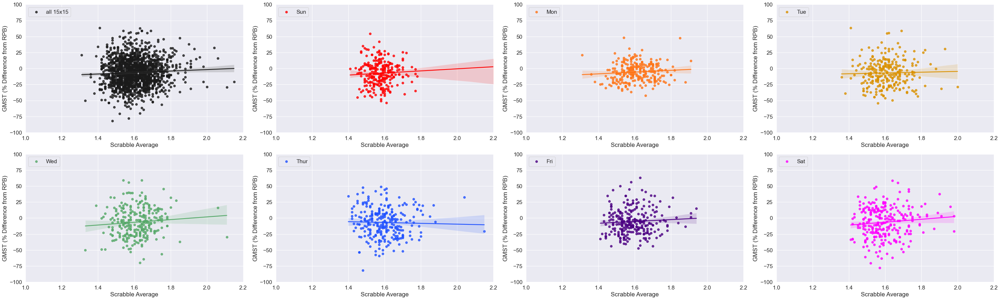

In [93]:
# Scrabble Average vs GMS Raw Solve Times
#RPB normalized version
# Fig. 14

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Scrabble_Avg", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Scrabble Average",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((1,2.2))
p.axes[1].set_xlim((1,2.2))
p.axes[2].set_xlim((1,2.2))
p.axes[3].set_xlim((1,2.2))
p.axes[4].set_xlim((1,2.2))
p.axes[5].set_xlim((1,2.2))
p.axes[6].set_xlim((1,2.2))
p.axes[7].set_xlim((1,2.2))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [94]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Scrabble_Avg']))

-0.027438762202468374


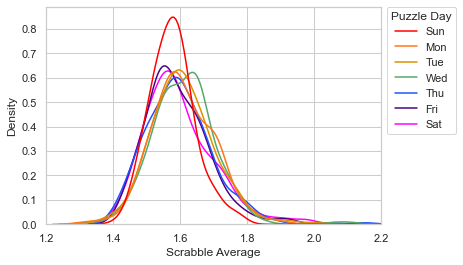

In [95]:
# Density plot of Scrabble Average in puzzles solved by GMS
# Fig. 14

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Scrabble_Avg", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(1.2, 2.2)
ax.set_xlabel("Scrabble Average")
plt.show()

In [96]:
GMS_df4["Scrabble_Avg"].agg(['min', 'max'])

min    1.31
max    2.45
Name: Scrabble_Avg, dtype: float64

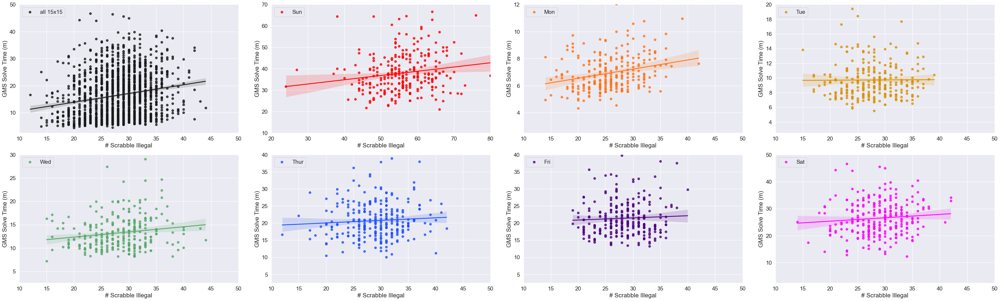

In [97]:
# Scrabble Illegal # vs GMS Raw Solve Times
# Fig. 15

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Scrabble_Illegal", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Scrabble Illegal",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,50))
p.axes[1].set_xlim((20,80))
p.axes[2].set_xlim((10,50))
p.axes[3].set_xlim((10,50))
p.axes[4].set_xlim((10,50))
p.axes[5].set_xlim((10,50))
p.axes[6].set_xlim((10,50))
p.axes[7].set_xlim((10,50))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

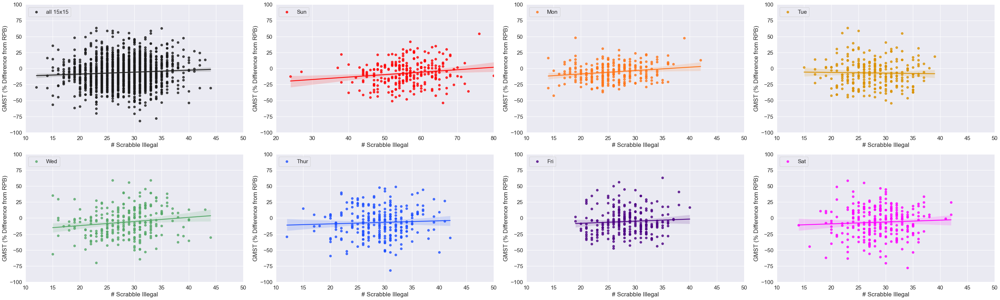

In [98]:
# Scrabble Illegal # vs GMS Raw Solve Times
#RPB-normalized version
# Fig. 15

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Scrabble_Illegal", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Scrabble Illegal",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,50))
p.axes[1].set_xlim((20,80))
p.axes[2].set_xlim((10,50))
p.axes[3].set_xlim((10,50))
p.axes[4].set_xlim((10,50))
p.axes[5].set_xlim((10,50))
p.axes[6].set_xlim((10,50))
p.axes[7].set_xlim((10,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [99]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#GMS_15x15 = GMS_df3.loc[GMS_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Scrabble_Illegal']))

0.19305784806163312


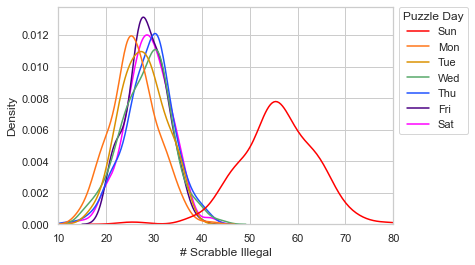

In [100]:
# Density plot of Scrabble Illegal # in puzzles solved by GMS
# Fig. 15

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Scrabble_Illegal", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(10, 80)
ax.set_xlabel("# Scrabble Illegal")
plt.show()

In [101]:
GMS_df4["Scrabble_Illegal"].agg(['min', 'max'])

min    12
max    80
Name: Scrabble_Illegal, dtype: int64

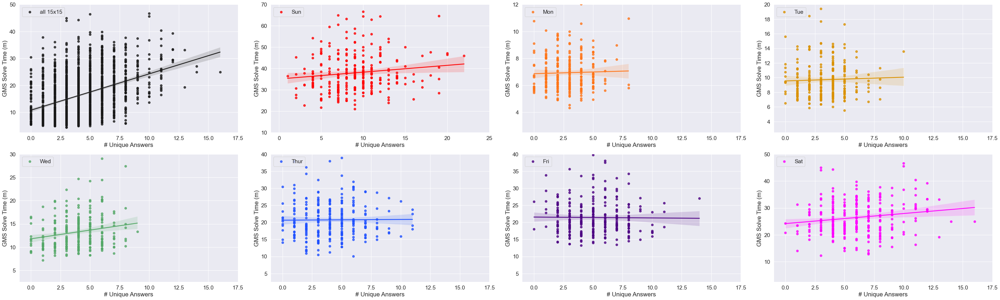

In [102]:
# Unique Answers # # vs GMS Raw Solve Times
# Fig. 16

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Unique_Answers", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Unique Answers",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,17.5))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,17.5))
p.axes[3].set_xlim((-1,17.5))
p.axes[4].set_xlim((-1,17.5))
p.axes[5].set_xlim((-1,17.5))
p.axes[6].set_xlim((-1,17.5))
p.axes[7].set_xlim((-1,17.5))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

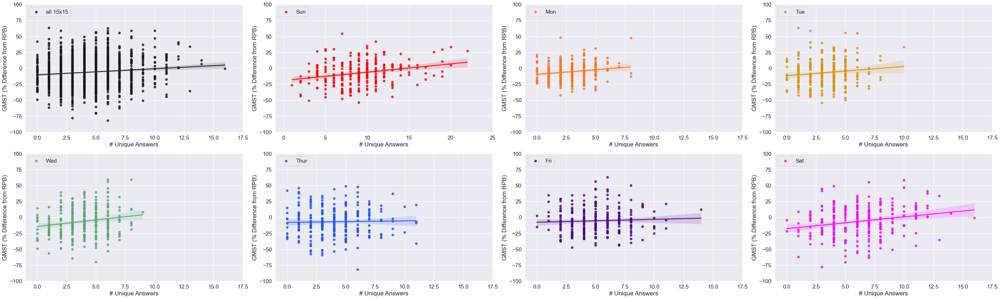

In [103]:
# Unique Answers # # vs GMS Raw Solve Times
#RPB normalized version
# Fig. 16

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Unique_Answers", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Unique Answers",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,17.5))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,17.5))
p.axes[3].set_xlim((-1,17.5))
p.axes[4].set_xlim((-1,17.5))
p.axes[5].set_xlim((-1,17.5))
p.axes[6].set_xlim((-1,17.5))
p.axes[7].set_xlim((-1,17.5))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [104]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#GMS_15x15 = GMS_df3.loc[GMS_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Unique_Answers']))

0.3969113888524092


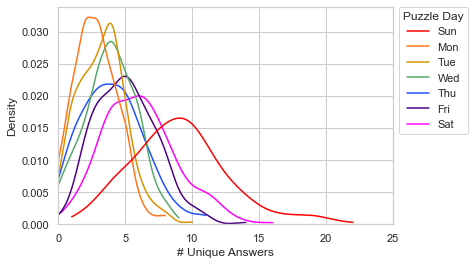

In [105]:
# Density plot of Unique Answers # in puzzles solved by GMS
# Fig. 16

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Unique_Answers", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,25))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 25)
ax.set_xlabel("# Unique Answers")
plt.show()

In [106]:
GMS_df4["Unique_Answers"].agg(['min', 'max'])

min     0
max    22
Name: Unique_Answers, dtype: int64

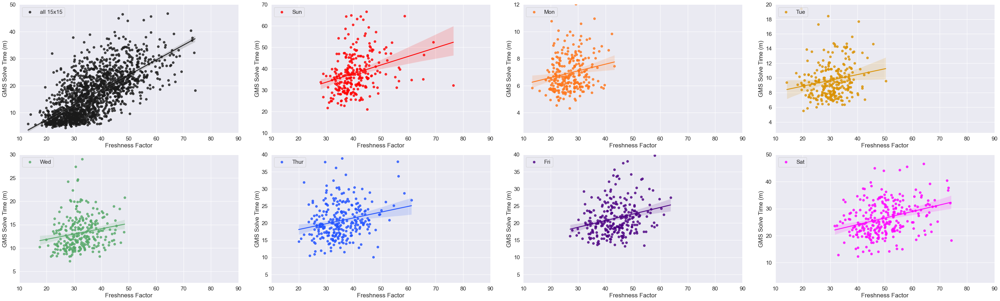

In [107]:
# Freshness Factor vs GMS Raw Solve Times
#Non-normed version
# Fig. 17

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Freshness_Factor", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Freshness Factor",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,90))
p.axes[1].set_xlim((10,90))
p.axes[2].set_xlim((10,90))
p.axes[3].set_xlim((10,90))
p.axes[4].set_xlim((10,90))
p.axes[5].set_xlim((10,90))
p.axes[6].set_xlim((10,90))
p.axes[7].set_xlim((10,90))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

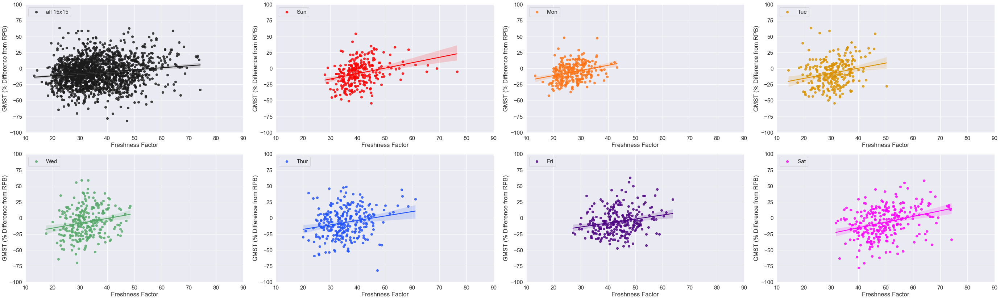

In [108]:
# Freshness Factor vs GMS Raw Solve Times
#RPB normalized version
# Fig. 17

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Freshness_Factor", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Freshness Factor",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,90))
p.axes[1].set_xlim((10,90))
p.axes[2].set_xlim((10,90))
p.axes[3].set_xlim((10,90))
p.axes[4].set_xlim((10,90))
p.axes[5].set_xlim((10,90))
p.axes[6].set_xlim((10,90))
p.axes[7].set_xlim((10,90))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [109]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Freshness_Factor']))

0.6931710989801858


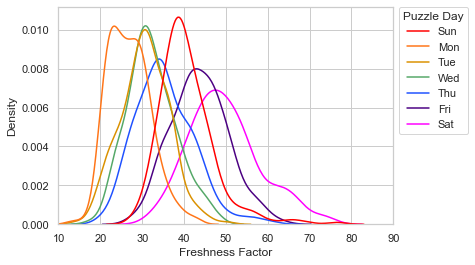

In [110]:
# Density plot of Freshness Factor in puzzles solved by GMS
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together
# Fig. 17

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Freshness_Factor", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(10, 90)
ax.set_xlabel("Freshness Factor")
plt.show()

In [111]:
GMS_df4["Freshness_Factor"].agg(['min', 'max'])

min    13.2
max    76.5
Name: Freshness_Factor, dtype: float64

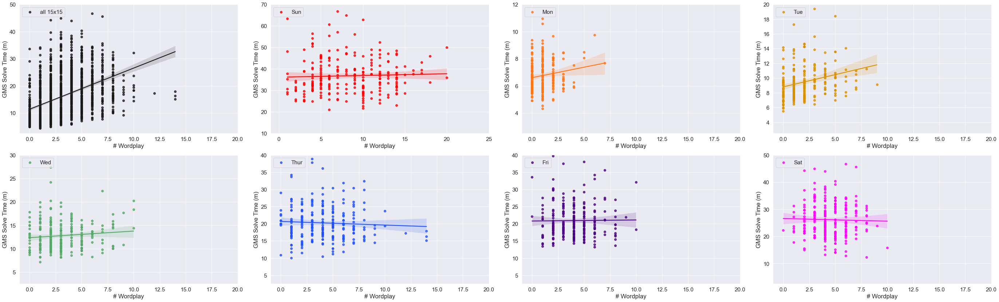

In [112]:
# Wordplay vs GMS Raw Solve Times
# Fig. 18

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Wordplay", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Wordplay",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,20))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,20))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

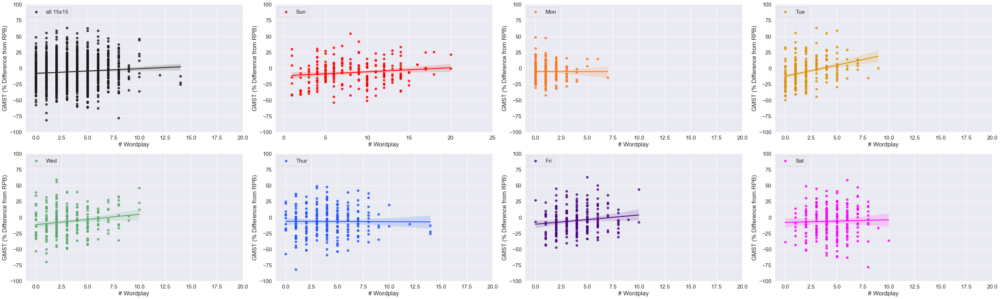

In [113]:
# Wordplay vs GMS Raw Solve Times
#RPB normalized version
# Fig. 18

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Wordplay", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Wordplay",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,20))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,20))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [114]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#GMS_15x15 = GMS_df3.loc[GMS_df3["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Wordplay']))

0.43704196852143645


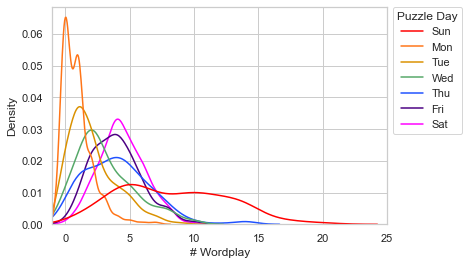

In [115]:
# Density plot of Wordplay in puzzles solved by GMST
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together
# Fig. 18

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Wordplay", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(-1, 25)
ax.set_xlabel("# Wordplay")
plt.show()

In [116]:
GMS_df4["Wordplay"].agg(['min', 'max'])

min     0.0
max    20.0
Name: Wordplay, dtype: float64

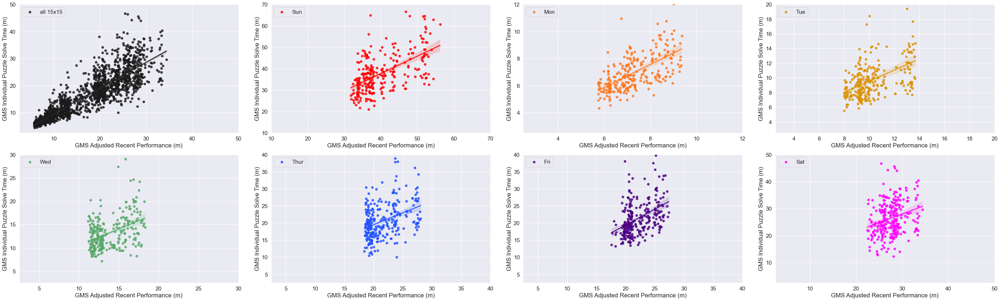

In [117]:
# GMS Recent Past Performance (Time-Decay Weighted Immediately Previous 40 Puzzles Prior to a given puzzle) vs GMS Raw Solve Times
# Fig. 19

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="GMS_pds_l40_dw", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "GMS Adjusted Recent Performance (m)",
    ylabel="GMS Individual Puzzle Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((2.5,50))
p.axes[1].set_xlim((10,70))
p.axes[2].set_xlim((2.5,12))
p.axes[3].set_xlim((2.5,20))
p.axes[4].set_xlim((2.5,30))
p.axes[5].set_xlim((2.5,40))
p.axes[6].set_xlim((2.5,40))
p.axes[7].set_xlim((2.5,50))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [120]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#GMS_15x15 = GMS_df4.loc[GMS_df4["DOW"]!=("Sunday")]

# Correlation for all 15x15 puzzles
print(GMS_15x15['GMST(m)'].corr(GMS_15x15['GMS_pds_l40_dw']))

# # Calculate Pearson R for each puzzle day for this feature
GMS_Sun = GMS_df4.loc[GMS_df4["DOW"]==("Sunday")]
print(GMS_Sun['GMST(m)'].corr(GMS_Sun['GMS_pds_l40_dw']))

GMS_Mon = GMS_df4.loc[GMS_df4["DOW"]==("Monday")]
print(GMS_Mon['GMST(m)'].corr(GMS_Mon['GMS_pds_l40_dw']))

GMS_Tue = GMS_df4.loc[GMS_df4["DOW"]==("Tuesday")]
print(GMS_Tue['GMST(m)'].corr(GMS_Tue['GMS_pds_l40_dw']))

GMS_Wed = GMS_df4.loc[GMS_df4["DOW"]==("Wednesday")]
print(GMS_Wed['GMST(m)'].corr(GMS_Wed['GMS_pds_l40_dw']))

GMS_Thu = GMS_df4.loc[GMS_df4["DOW"]==("Thursday")]
print(GMS_Thu['GMST(m)'].corr(GMS_Thu['GMS_pds_l40_dw']))

GMS_Fri = GMS_df4.loc[GMS_df4["DOW"]==("Friday")]
print(GMS_Fri['GMST(m)'].corr(GMS_Fri['GMS_pds_l40_dw']))

GMS_Sat = GMS_df4.loc[GMS_df4["DOW"]==("Saturday")]
print(GMS_Sat['GMST(m)'].corr(GMS_Sat['GMS_pds_l40_dw']))

0.8661618156789277
0.5744940793214205
0.6131425149360061
0.47456003989197215
0.4195598682793072
0.37875753549925906
0.42493717987833923
0.25505410959972646


In [121]:
GMS_15x15.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1613 entries, 141 to 894
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1613 non-null   datetime64[ns]
 1   P_Date_str                             1613 non-null   object        
 2   P_Yr                                   1613 non-null   period[A-DEC] 
 3   2023+_puzzle                           1613 non-null   float64       
 4   DOW                                    1613 non-null   object        
 5   DOW_num                                1613 non-null   float64       
 6   GMST(m)                                1613 non-null   float64       
 7   GMST(m)_10p_MA                         1613 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1613 non-null   int64         
 9   GMS_pds_l40_dw                         1613 non-null   float64

### Data Supplement

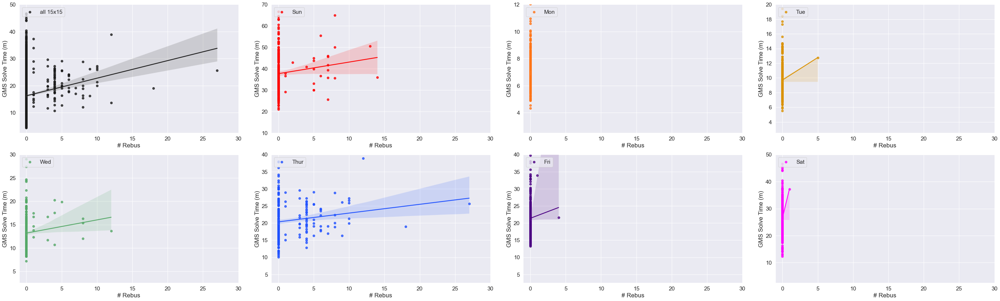

In [122]:
# Rebus vs GMS Raw Solve Times
#Fig. S2
#non-normed version

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Rebus_Count", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Rebus",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,30))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,30))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

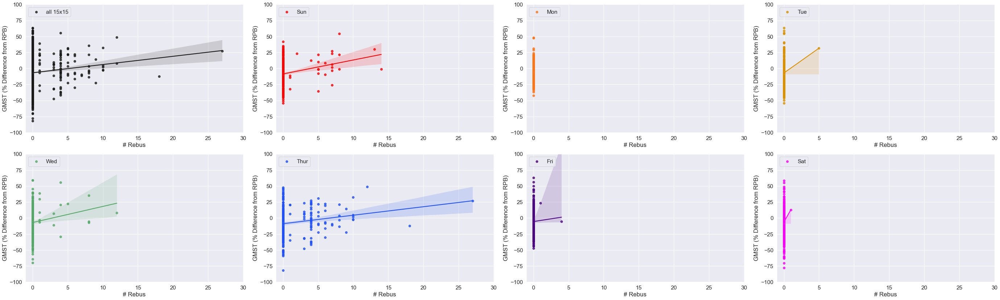

In [123]:
# Rebus vs GMS Raw Solve Times
#RPB normalized version
#Fig. S2

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Rebus_Count", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Rebus",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,30))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,30))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [124]:
# Calculate Pearson R for 15x15 grids for GMST for this feature
#GMS_15x15 = GMS_df4.loc[GMS_df4["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Rebus_Count']))

# Calculate Pearson R for each puzzle day for this feature
GMS_Sun = GMS_df4.loc[GMS_df4["DOW"]==("Sunday")]
print(GMS_Sun['GMST(m)'].corr(GMS_Sun['Rebus_Count']))

GMS_Mon = GMS_df4.loc[GMS_df4["DOW"]==("Monday")]
print(GMS_Mon['GMST(m)'].corr(GMS_Mon['Rebus_Count']))

GMS_Tue = GMS_df4.loc[GMS_df4["DOW"]==("Tuesday")]
print(GMS_Tue['GMST(m)'].corr(GMS_Tue['Rebus_Count']))

GMS_Wed = GMS_df4.loc[GMS_df4["DOW"]==("Wednesday")]
print(GMS_Wed['GMST(m)'].corr(GMS_Wed['Rebus_Count']))

GMS_Thu = GMS_df4.loc[GMS_df4["DOW"]==("Thursday")]
print(GMS_Thu['GMST(m)'].corr(GMS_Thu['Rebus_Count']))

GMS_Fri = GMS_df4.loc[GMS_df4["DOW"]==("Friday")]
print(GMS_Fri['GMST(m)'].corr(GMS_Fri['Rebus_Count']))

GMS_Sat = GMS_df4.loc[GMS_df4["DOW"]==("Saturday")]
print(GMS_Sat['GMST(m)'].corr(GMS_Sat['Rebus_Count']))

0.11666825723856449
0.11727208523945662
nan
0.07175691479290237
0.1008480783208921
0.15564196436335187
0.03895579630877262
0.10186803358082043


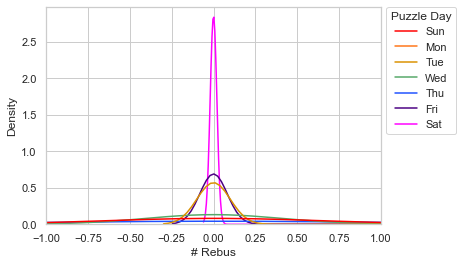

In [125]:
# Density plot of Rebus Count in puzzles solved by GMS
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together

GMS_df4 = GMS_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=GMS_df4, x = "Rebus_Count", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(-1, 1)
ax.set_xlabel("# Rebus")
plt.show()

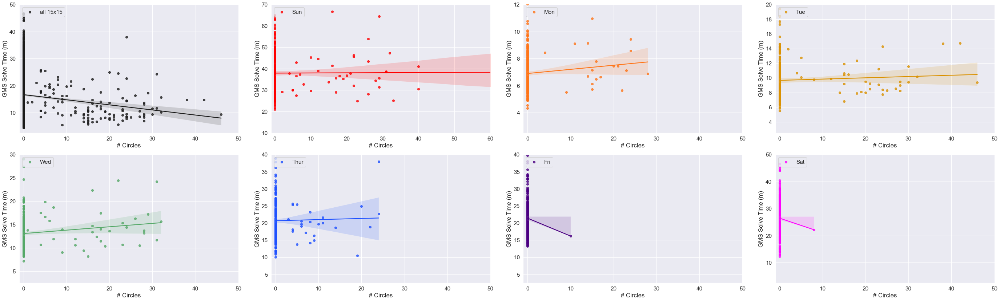

In [126]:
# Circles vs GMS Raw Solve Times
#Fig. S3
#non-normed version

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Circle_Count", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Circles",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

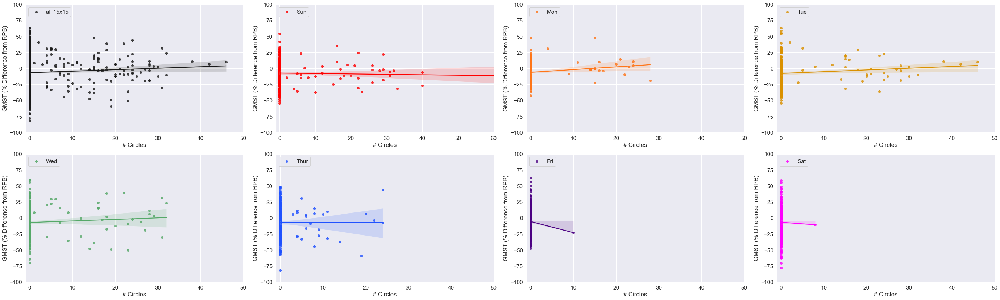

In [127]:
# Circles vs GMS Raw Solve Times
#RPB Normed version
# Fig. S3

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Circle_Count", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Circles",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [128]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#GMS_15x15 = GMS_df4.loc[GMS_df4["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Circle_Count']))

# Calculate Pearson R for each puzzle day for this feature
GMS_Sun = GMS_df4.loc[GMS_df4["DOW"]==("Sunday")]
print(GMS_Sun['GMST(m)'].corr(GMS_Sun['Circle_Count']))

GMS_Mon = GMS_df4.loc[GMS_df4["DOW"]==("Monday")]
print(GMS_Mon['GMST(m)'].corr(GMS_Mon['Circle_Count']))

GMS_Tue = GMS_df4.loc[GMS_df4["DOW"]==("Tuesday")]
print(GMS_Tue['GMST(m)'].corr(GMS_Tue['Circle_Count']))

GMS_Wed = GMS_df4.loc[GMS_df4["DOW"]==("Wednesday")]
print(GMS_Wed['GMST(m)'].corr(GMS_Wed['Circle_Count']))

GMS_Thu = GMS_df4.loc[GMS_df4["DOW"]==("Thursday")]
print(GMS_Thu['GMST(m)'].corr(GMS_Thu['Circle_Count']))

GMS_Fri = GMS_df4.loc[GMS_df4["DOW"]==("Friday")]
print(GMS_Fri['GMST(m)'].corr(GMS_Fri['Circle_Count']))

GMS_Sat = GMS_df4.loc[GMS_df4["DOW"]==("Saturday")]
print(GMS_Sat['GMST(m)'].corr(GMS_Sat['Circle_Count']))

-0.11361966821800787
0.0061595557795928214
0.10386141599334472
0.053274666887276695
0.13560491654529996
0.022843085809702894
-0.06278606557857724
-0.040271070580034166


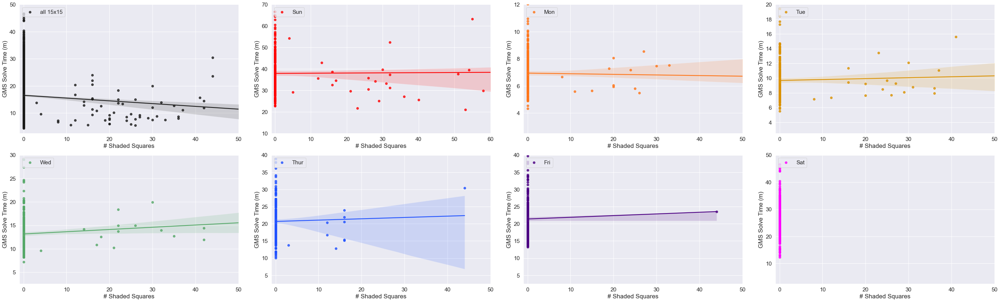

In [129]:
# Shaded Squares vs GMS Raw Solve Times
# non-norned version
# Fig. S4

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Shade_Count", y="GMST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Shaded Squares",
    ylabel="GMS Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((2.5,50))
p.axes[1].set_ylim((10,70))
p.axes[2].set_ylim((2.5,12))
p.axes[3].set_ylim((2.5,20))
p.axes[4].set_ylim((2.5,30))
p.axes[5].set_ylim((2.5,40))
p.axes[6].set_ylim((2.5,40))
p.axes[7].set_ylim((2.5,50))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

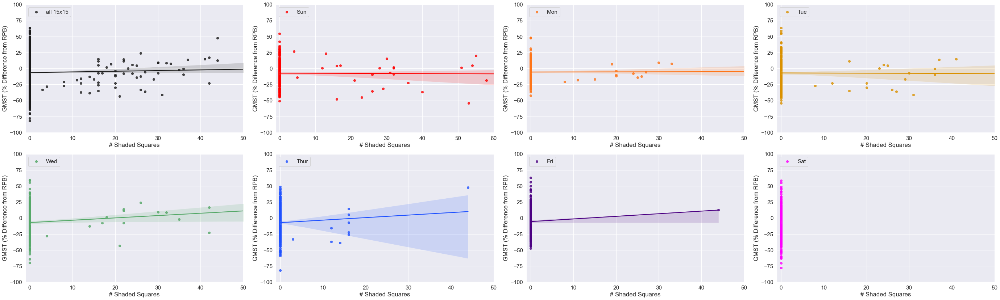

In [130]:
# Shaded Squares vs GMS Raw Solve Times
# RPB normalized version
# Fig. S4

GMS_df4a = GMS_df4a.sort_values(by=['DOW_num'], ascending = True)

GMS_df4a['plot_seq_map'] = GMS_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=GMS_df4a, x="Shade_Count", y="GMST_Diff%_from_GMS_pds_l40_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Shaded Squares",
    ylabel="GMST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [131]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#GMS_15x15 = GMS_df4.loc[GMS_df4["DOW"]!=("Sunday")]

print(GMS_15x15['GMST(m)'].corr(GMS_15x15['Shade_Count']))

# Calculate Pearson R for each puzzle day for this feature
GMS_Sun = GMS_df4.loc[GMS_df4["DOW"]==("Sunday")]
print(GMS_Sun['GMST(m)'].corr(GMS_Sun['Shade_Count']))

GMS_Mon = GMS_df4.loc[GMS_df4["DOW"]==("Monday")]
print(GMS_Mon['GMST(m)'].corr(GMS_Mon['Shade_Count']))

GMS_Tue = GMS_df4.loc[GMS_df4["DOW"]==("Tuesday")]
print(GMS_Tue['GMST(m)'].corr(GMS_Tue['Shade_Count']))

GMS_Wed = GMS_df4.loc[GMS_df4["DOW"]==("Wednesday")]
print(GMS_Wed['GMST(m)'].corr(GMS_Wed['Shade_Count']))

GMS_Thu = GMS_df4.loc[GMS_df4["DOW"]==("Thursday")]
print(GMS_Thu['GMST(m)'].corr(GMS_Thu['Shade_Count']))

GMS_Fri = GMS_df4.loc[GMS_df4["DOW"]==("Friday")]
print(GMS_Fri['GMST(m)'].corr(GMS_Fri['Shade_Count']))

GMS_Sat = GMS_df4.loc[GMS_df4["DOW"]==("Saturday")]
print(GMS_Sat['GMST(m)'].corr(GMS_Sat['Shade_Count']))

-0.08535873467361614
0.017885836638621196
-0.03988573395937665
0.03647896039767286
0.10444103899119407
0.027617078516495842
0.025901504209606546
nan
